# OCR Cookbook

---

## OCR Exploration and Structured Outputs
In this cookbook, we will explore the basics of OCR and leverage it together with existing models to achieve structured outputs fueled by our OCR model.

You may want to do this in case current vision models are not powerful enough, hence enhancing their vision OCR capabilities with the OCR model to achieve better structured data extraction.

---

### Model Used
- Mistral OCR
- Pixtral 12B & Ministral 8B


## Setup

First, let's install `mistralai` and download the required files.

In [8]:
%%capture
!pip install mistralai

### Download PDF and image files

In [9]:
%%capture
!wget https://raw.githubusercontent.com/mistralai/cookbook/refs/heads/main/mistral/ocr/mistral7b.pdf
!wget https://raw.githubusercontent.com/mistralai/cookbook/refs/heads/main/mistral/ocr/receipt.png

## Mistral OCR with PDF

We will need to set up our client. You can create an API key on our [Plateforme](https://console.mistral.ai/api-keys/).

In [10]:
# Initialize Mistral client with API key
from mistralai import Mistral

api_key = "LtDryA5d8QRvp2x6hMRnekBHSFhr02cy" # Replace with your API key
client = Mistral(api_key=api_key)

There are two types of files you can apply OCR to:
- 1. PDF files
- 2. Image files

Let's start with a PDF file:

In [12]:
# Import required libraries
from pathlib import Path
from mistralai import DocumentURLChunk, ImageURLChunk, TextChunk
import json

# Verify PDF file exists
pdf_file = Path("19-1996 (1).pdf")
assert pdf_file.is_file()

# Upload PDF file to Mistral's OCR service
uploaded_file = client.files.upload(
    file={
        "file_name": pdf_file.stem,
        "content": pdf_file.read_bytes(),
    },
    purpose="ocr",
)

# Get URL for the uploaded file
signed_url = client.files.get_signed_url(file_id=uploaded_file.id, expiry=1)

# Process PDF with OCR, including embedded images
pdf_response = client.ocr.process(
    document=DocumentURLChunk(document_url=signed_url.url),
    model="mistral-ocr-latest",
    include_image_base64=True
)

# Convert response to JSON format
response_dict = json.loads(pdf_response.model_dump_json())

print(json.dumps(response_dict, indent=4)[0:1000]) # check the first 1000 characters

{
    "pages": [
        {
            "index": 0,
            "markdown": "EXPEDIENTE DE SOLICITUD PARA LA INSTALACION Y APERTURA/FUNCIONA.\nNUMERO EXPT19/96-EC NUMERO DOC. D00001029\nSOLICITANTE: GALOMA RESTAURACION SL\nDOMICILIO: C/ BAJA No 1\nPOBLACION:PAGUERA TELEFONO:\nREPRESENTANTE:\nDOMICILIO:\nACTIVIDAD:RESTAURANTE UN TENEDOR\nEMPLAZAMIENTO: AVDA PAGUERA, 52, BAJOS PAGUERA\nPLAZO PARA LA INSTALACION:\n![img-0.jpeg](img-0.jpeg)\n\nINFORMACION PUBLICA_\nRECLAMACIONES\n\nCOMISION DE GOBIERNO $\\qquad$ F $\\quad$ D $\\qquad$\nLICENCIA DE INSTALACION $\\qquad$ 1-3 76\nOTORGAMIENTO: $\\qquad$ DENEGACION: $\\qquad$\n\nVISITA DE COMPROBACION\nDEFICIENCIAS VISITA DE COMPROBACION $\\qquad$\nLICENCIA DE APERTURA\nOBSERVACIONES:\n![img-1.jpeg](img-1.jpeg)",
            "images": [
                {
                    "id": "img-0.jpeg",
                    "top_left_x": 266,
                    "top_left_y": 1014,
                    "bottom_right_x": 1612,
                    "bottom_ri

View the result with the following:

EXPEDIENTE DE SOLICITUD PARA LA INSTALACION Y APERTURA/FUNCIONA.
NUMERO EXPT19/96-EC NUMERO DOC. D00001029
SOLICITANTE: GALOMA RESTAURACION SL
DOMICILIO: C/ BAJA No 1
POBLACION:PAGUERA TELEFONO:
REPRESENTANTE:
DOMICILIO:
ACTIVIDAD:RESTAURANTE UN TENEDOR
EMPLAZAMIENTO: AVDA PAGUERA, 52, BAJOS PAGUERA
PLAZO PARA LA INSTALACION:
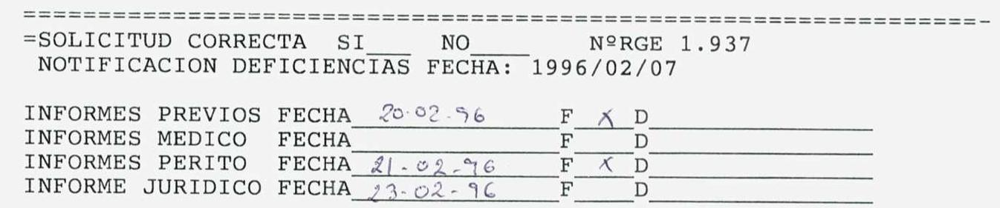

INFORMACION PUBLICA_
RECLAMACIONES

COMISION DE GOBIERNO $\qquad$ F $\quad$ D $\qquad$
LICENCIA DE INSTALACION $\qquad$ 1-3 76
OTORGAMIENTO: $\qquad$ DENEGACION: $\qquad$

VISITA DE COMPROBACION
DEFICIENCIAS VISITA DE COMPROBACION $\qquad$
LICENCIA DE APERTURA
OBSERVACIONES:
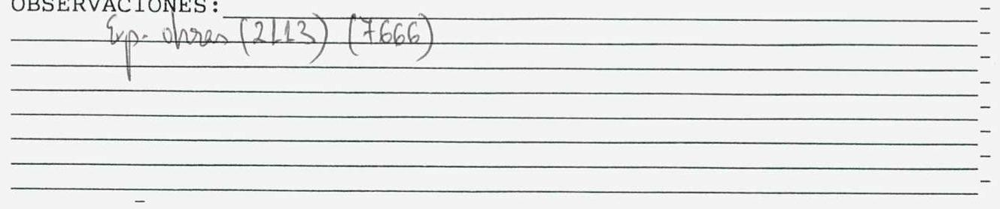

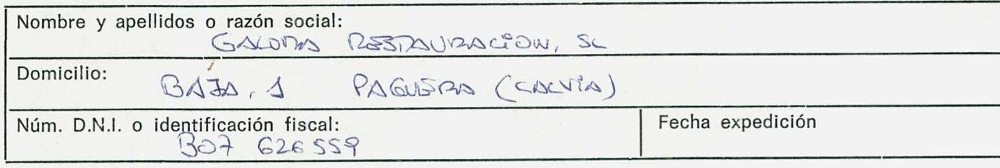

REPRESENTANTE
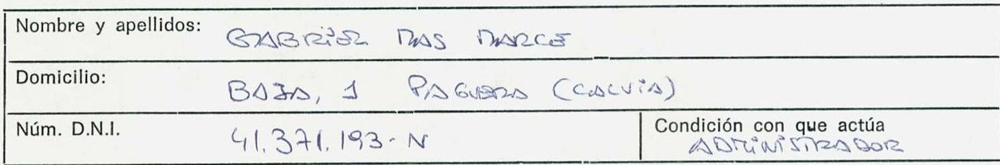

EXPONE: Que promuevo expediente en solicitud de licencia municipal de instalación, apertura y funcionamiento relativa a RESIDUCIAS de un TENEICO en su PAGIDA, 52 GADA PAGIDA de este término municipal, actividad afectada por el Reglamento de Actividades Molestas, Insalubres, Nocivas o Pelli-grosas de 30 de Noviembre de 1961, así como la Licencia de Obras necesarias para la instalación de referencia prevista en el Art. 178 de la Ley del Suelo

# DOCUMENTOS QUE SE ACOMPAÑAN 

1) ejemplares de instancia.
2) 3 del Proyecto Técnico y la Memoria descriptiva visados por el Colegio Oficial correspondiente, en que se detallen las características de la actividad que se propone, repercusión sobre la sanidad ambiental y sistemas correctores que se propone utilizar.
3) Técnico autor del Proyecto: ANTOVÍS SALVIDAS

SOLICITA

SUPLICO a Vd. se digne otorgar la licencia municipal previa al ejercicio de la actividad solicitada.
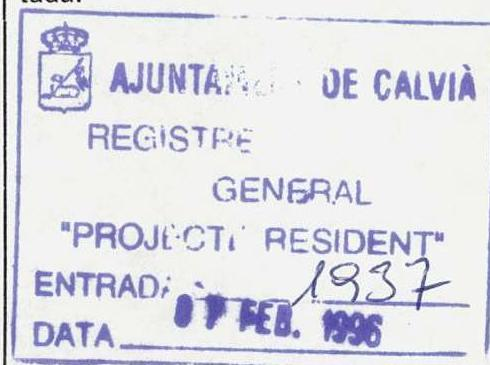

En Calviá a de 19
EL SOLICITANTE,
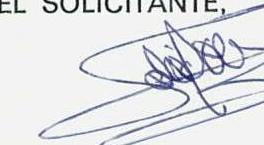

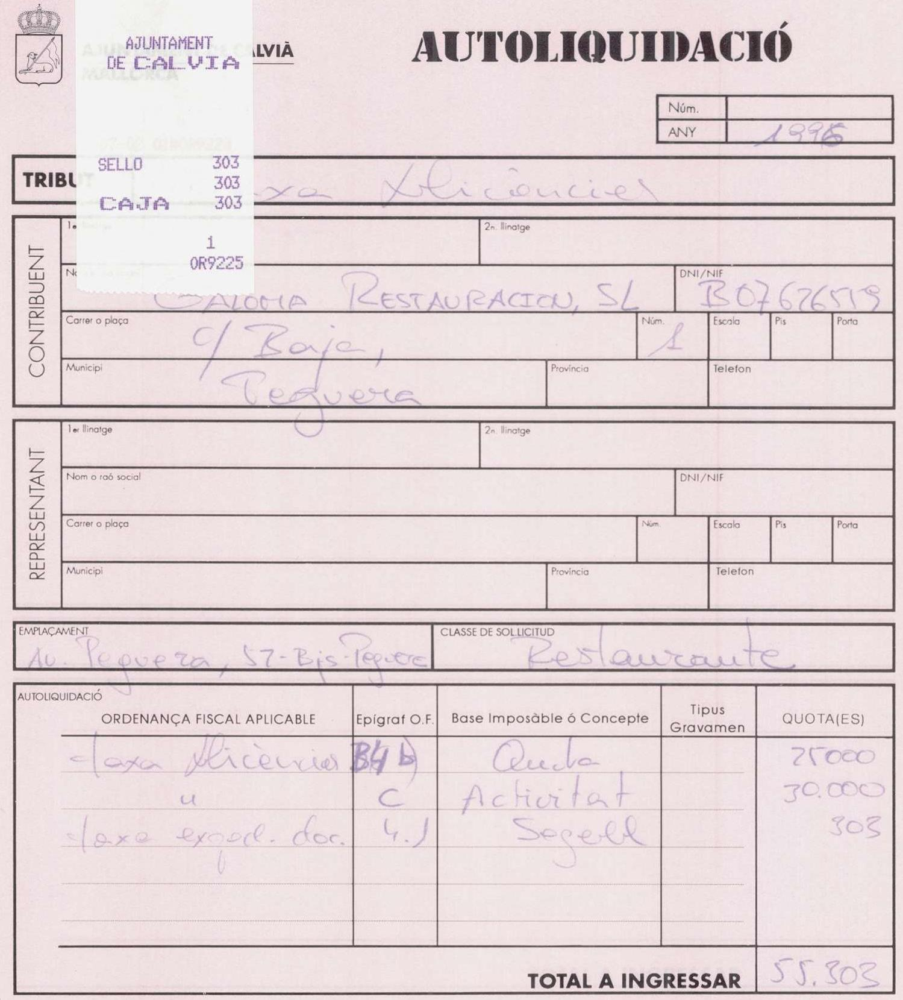

DILIGÉNCIA D'INGRÉS
NO ES VAIDA SENSE EL SEGEL DE L'OFICINA RECAPTADORA
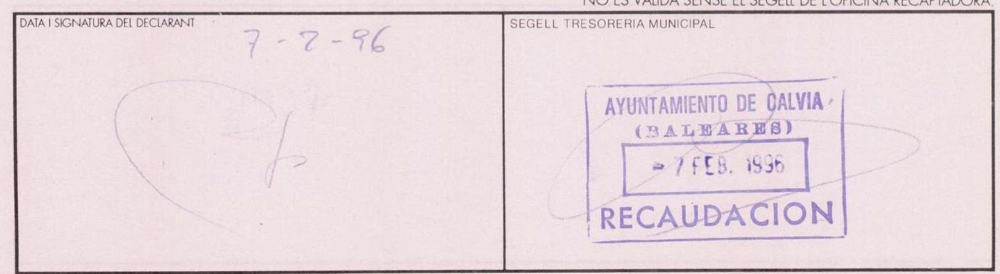

El Ingeniero Industrial, colegiado n ${ }^{\circ} 75$
D. Antonio Salom Mas hace constar que

ASUME LA DIRECCION facultativa de las obras del PROYECTO DE ACONDICIONANIENTO DE LOCAL DESTINADO A RESTAURANTE DE UN TENEDOR. propiedad de GALOMA RESTAURACION, S.L. situadas en AVD. PEGUERA,S/N PAGUERA CALVIA a los efectos de las Ordenanzas Municipales vigentes

Palma, a 10 de enero de 1.996
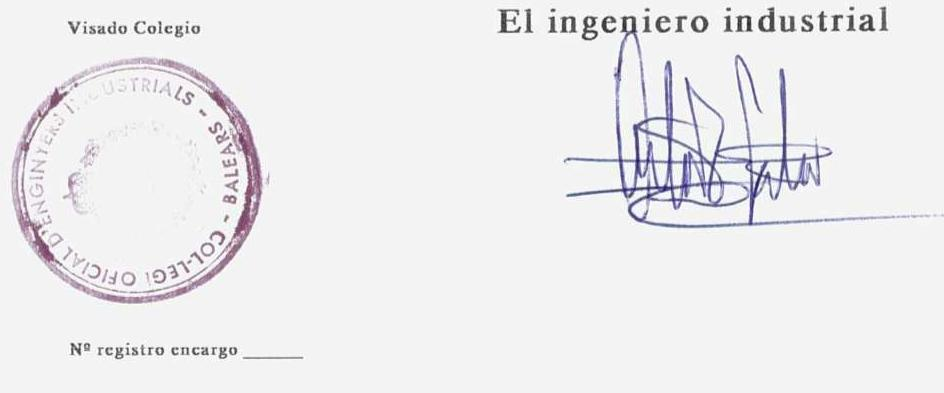

# ILMA. SRA. ALCALDESA DE CALVIA

# AJUNTAMENT DE CALVIA MALLORCA 

## INFORME ARQUITECTO TECNICO

SOLICITANTE : GALOMA RESTAURACION SL
DOMICILIO : C/ BAJA No 1
07160
REPRESENTANTE :

ACTIVIDAD : RESTAURANTE UN TENEDOR
EMPLAZAMIENTO : AVDA PAGUERA, 52, BAJOS
EXPTE
: AY 146-EC
En relación al expediente de referencia,el Arquitecto
Tecnico que suscribe, emite el siguiente informe:
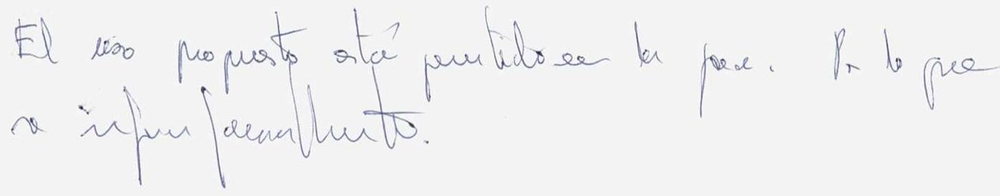
calviá a 20 Febre 1986
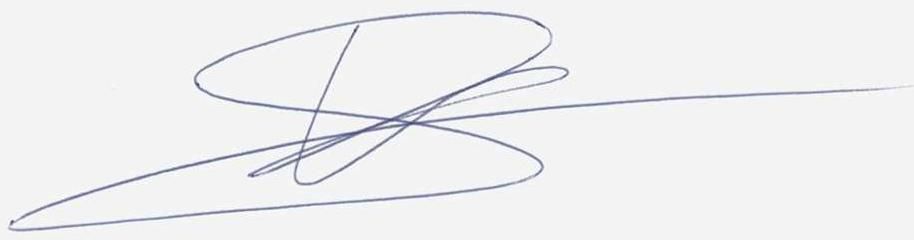

# AJUNTAMENT DE CALVIA MALLORCA 

## INFORME PERITO INDUSTRIAL

SOLICITANTE : GALOMA RESTAURACION SL
DOMICILIO : C/ BAJA No 1
PAGUERA
07160
EXPEDIENTE : 19/96-EC
ACTIVIDAD : RESTAURANTE UN TENEDOR
EMPLAZAMIENTO : AVDA PAGUERA, 52, BAJOS
PAGUERA
La presente Actividad Sí está excluida de calificación, de acuerdo con lo previsto en la vigente Ley 8/1995 de 30 de marzo.

Examinado el Proyecto Técnico presentado en solicitud de Licencia de Instalación para acondicionar un local destinado a la Actividad descrita en el epígrafe, el Perito Industrial Municipal que suscribe informa lo siguiente:

Se atinua infirmos fomalecuente la solicitud de econdicio: manueto de local por intitulea la Actividad referenciada, conci-

# AJUNTAMENT DE CALVIȦ <br> MALLORCA 

## INFORME JURIDICO.

SOLICITANTE: GALOMA RESTAURACION SL DOMICILIO:BAJA, Nㅜ1- PEGUERA REPRESENTANTE:
EXPEDIENTE:19/96 EC
ACTIVIDAD:RESTAURANTE UN TENEDOR
EMPLAZAMIENTO:AVDA PEGUERA, 52, BAJOS.-PEGUERA
En relación con el expediente de referencia y en cumplimiento de lo previsto en el art. 23 de la Ley $8 / 1995$, de atribución de competencias a los consejos insulares en materia de actividades clasificadas y parques acuáticos, reguladora del procedimiento y de las infracciones y sanciones, INFORMO que la solicitud SE AJUSTA a lo establecido en la citada Ley, en la Ley 30/1992, de 26 de noviembre, de Régimen Jurídico de las Administraciones Públicas y del Procedimiento Administrativo Común y en las Ordenanzas Fiscales del Ayuntamiento de Calvià.

No obstante lo anterior, al notificar la licencia de instalación hay que requerir al interesado para que presennte copia de la escritura de constitución de la sociedad limitada.

Calvià, a 1 Marzo 1996
LA T.A.E,
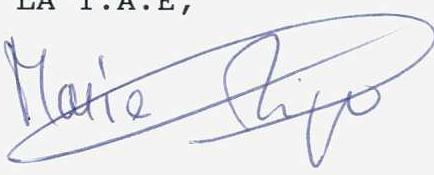

FDO. MARIA RIGO MARTINEZ.

# AJUNTAMENT DE CALVIA MALLORCA 

DECRETO.-Vistos los informes favorables emitidos por los Técnicos Municipales, referente al expediente: Expte. 19/96-EC
TITULAR: GALOMA RESTAURACION SL. ACTIVIDAD: RESTAURANTE UN TENEDOR. EMPLAZAMIENTO: AVDA PAGUERA, 52, BAJOS. PAGUERA.
mediante el presente, resuelvo otorgar LICENCIA DE INSTALACION condicionada al cumplimiento de las siguientes prescripciones:
10.- El interesado dispone de un plazo de 3 MESES para realizar las instalaciones, transcurrido el cual deberá solicitar del Ayuntamiento la licencia de apertura y funcionamiento. Con ésta solicitud se acompañará:
a) Una certificación del Técnico director de las instalaciones, con visado del Colegio Profesional correspondiente, acreditativo de su conformidad con la Licencia Municipal de instalación, así como de la eficacia de las medidas correctoras.
b) La acreditación de las autorizaciones, licencias o concesiones que, en su caso, la normativa sectorial atribuya a otras administraciones públicas, como requisito previo para el otorgamiento de la Licencia Municipal de apertura y funcionamiento.
20.- No se podrá comenzar la actividad sin que no se haya concedido la Licencia Municipal de Apertura y Funcionamiento. En el supuesto de que se ejerza la actividad sin contar con la Licencia Municipal de Apertura se decretará la paralización y clausura de aquella (Arts.16, 20.3 y 30 de la Ley 8/1995, de 30 de marzo, de atribución de competencias a los Consejos Insulares en materia de actividades clasificadas y parques acuáticos, reguladora del procedimiento y de las infracciones y sanciones.
30.- El aforo total será de 46 personas en el local.
40.- El alumbrado de la sala se dividirá en varios circuitos independientes, para evitar que puedan quedar totalmente a oscuras en caso de una avería parcial, por lo que deberán instalarse más de un interruptor diferencial.
50.- Mantenimiento del nivel de riesgo intrínseco BAJO, en función de la carga ponderada del local Qp, en Mcal/m2 (debiendo $\mathrm{Qp}<100$ ).
Debe hacerse constar el valor de Qp en el Certificado ...///...

# AJUNTAMENT DE CALVIÁ MALLORCA 

## ...///...

final de obra redactado por el Tecnico Director.
60.- Cumplimiento de las medidas correctoras del Proyecto Técnico.
70.- Presentación de fotocopia de la escritura de constitución de la sociedad limitada, y nombramiento del representante.

Lo manda y firma el Sra. Alcaldesa, en Calviá 1 Marzo 1996.

LA ALCALDESA,
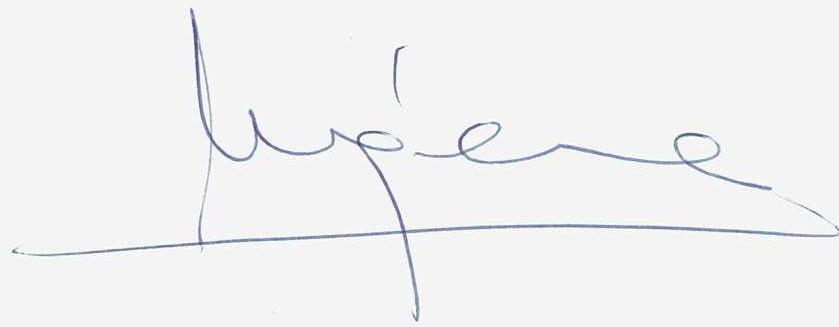

# AJUNTAMENT DE CALVIA MALLORCA 

## Expte. 19/96-EC

TITULAR: GALOMA RESTAURACION SL ACTIVIDAD: RESTAURANTE UN TENEDOR EMPLAZAMIENTO: AVDA PAGUERA, 52, BAJOS PAGUERA

En virtud de la resolución de la Alcaldía, de fecha 1 Marzo 1996 referente a la solicitud de instalación y apertura/funcionamiento, del expediente de referencia, resolvió lo siguiente:
"DECRETO.-Vistos los informes favorables emitidos por los Técnicos Municipales, referente al expediente:
Expte. 19/96-EC
TITULAR: GALOMA RESTAURACION SL.
ACTIVIDAD: RESTAURANTE UN TENEDOR.
EMPLAZAMIENTO: AVDA PAGUERA, 52, BAJOS.
PAGUERA.
mediante el presente, resuelvo otorgar LICENCIA DE INSTALACION condicionada al cumplimiento de las siguientes prescripciones:
10.- El interesado dispone de un plazo de 3 MESES para realizar las instalaciones, transcurrido el cual deberá solicitar del Ayuntamiento la licencia de apertura y funcionamiento. Con ésta solicitud se acompañará:
a) Una certificación del Técnico director de las instalaciones, con visado del Colegio Profesional correspondiente, acreditativo de su conformidad con la Licencia Municipal de instalación, así como de la eficacia de las medidas correctoras.
b) La acreditación de las autorizaciones, licencias o concesiones que, en su caso, la normativa sectorial atribuya a otras administraciones públicas, como requisito previo para el otorgamiento de la Licencia Municipal de apertura y funcionamiento.
20.- No se podrá comenzar la actividad sin que no se haya concedido la Licencia Municipal de Apertura y Funcionamiento. En el supuesto de que se ejerza la actividad sin contar con la Licencia Municipal de Apertura se decretará la paralización y clausura de aquella (Arts.16, 20.3 y 30 de la Ley 8/1995, de 30 de marzo, de atribución de competencias a los Consejos Insulares en materia de actividades clasificadas y parques acuáticos, reguladora del procedimiento y de las infracciones y sanciones.
30.- El aforo total será de 46 personas en el local.
40.- El alumbrado de la sala se dividirá en varios circuitos independientes, para evitar que puedan quedar totalmente a oscuras en caso de una iaveria parcial, por lo que

# AJUNTAMENT DE CALVIÀ MALLORCA 

## ...///...

deberán instalarse más de un interruptor diferencial.
50.- Mantenimiento del nivel de riesgo intrinseco BAJO, en función de la carga ponderada del local Qp, en Mcal/m2 (debiendo Qp< 100).

Debe hacerse constar el valor de Qp en el Certificado final de obra redactado por el Tecnico Director.
60.- Cumplimiento de las medidas correctoras del Proyecto Técnico.
70.- Presentación de fotocopia de la escritura de constitución de la sociedad limitada, y nombramiento del representante.

Lo manda y firma el Sra. Alcaldesa, en Calviá 1 Marzo 1996.

Lo que comunico a Ud. para su conocimiento y efectos, advirtiéndole que transcurrido el plazo de TRES MESES sin que se hayan realizado las instalaciones, se decretará la caducidad del procedimiento, de acuerdo con lo previsto en el Art, 92 de la Ley $30 / 92$, de 30 de noviembre, de Régimen Jurídico de las Administraciones Públicas y del Procedimiento Administrativo Común.

Significándole que la presente resolución pone fin a la vía administrativa (Art. 52.2 de la Ley $7 / 1985$, de 2 de abril, y disposiciones concordantes) y que previa la comunicación al Ayuntamiento referida en el art. 110.3 de la Ley 30/92, de 26 de noviembre, puede interponerse RECURSO CONTENCIOSO-ADMINISTRATIVO regulado en los arts. 57 y ss. de la Ley Jurisdiccional, en el plazo de DOS MESES a contar desde el día siguiente a la recepción de la presente notificación, ante la Sala de lo Contencioso-Administrativo del Tribunal Superior de Justicia de las Islas Baleares; sin perjuicio de que pueda ejercitar cualquier otra acción o interponer cualquier otro recurso que estime procedente en defensa de sus intereses.

Calviá a, 1 Marzo 1996.
LA SECRETARIA
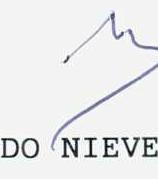

# AJUNTAMENT DE CALVIA MALLORCA 

## 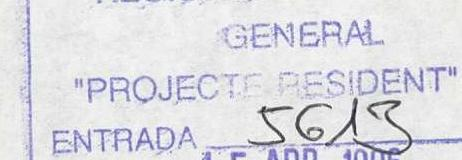

Can Vich, 29
Tel. 139103
07184 - CALVIA

DADES DEL SOLLICITANT O REPRESENTANT / DATOS DEL SOLICITANTE O REPRESENTANTE
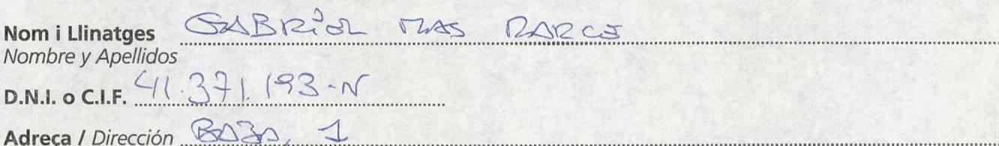

Consignau el mitjà preferent per a comunicacions / Consigne el modo de Comunicación preferente
Tel. 08521 Fax $\qquad$ $\square$ Correu/o

## EN REPRESENTACIÓ DE / EN REPRESENTACIÓN DE

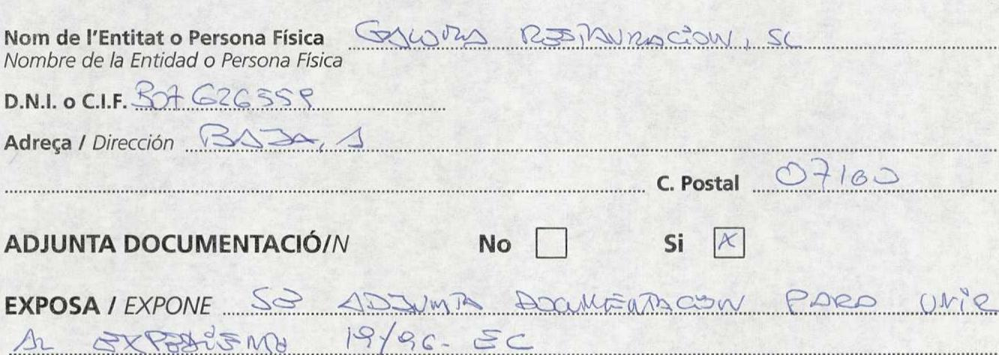

## ADJUNTA DOCUMENTACIÓ/N

No $\square$ Si $\square$
EXPOSA / EXPONE 3. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4

# CERTIFICADO DE DIRECCION DE OBRA Y/O INSTALACION 

## Expediente $\mathrm{n}^{\circ}$

$\qquad$ Organismo: $\qquad$

## DON

$\qquad$ ANTONIO SALOM MAS Ingeniero Industrial, Colegiado $n^{\circ} 75$ en el COLEGIO OFICIAL DE INGENIEROS INDUSTRIALES DE BALEARES, Director de las cbras relativas al:

PROYECTO:DE ACONDICIONAMIENTO DE LOCAL DESTINADO A
RESTAURANTE DE UN TENEDOR
Titular: CALOMA RESTAURACION, S.L.
Emplazamiento: AV. PEGUERA, S/N
Población: CALVIA
Presupuesto: 4.513 .800 $\qquad$ Ptas.

CERTIFICO:
Que dichas instalaciones ya terminadas, han sido realizadas bajo mi dirección, ajustándose al Proyecto redactado por EL MISMO
por el Colegio Oficial de INGENIEROS INDUSTRIALES DE BALEARES en fecha 11/ENERO/96 y $\mathrm{n}^{\circ} 35602$
habiéndose realizado las siguientes pruebas:
LA CARGA DE FUEGO PREVISTA ES DE 35 Mca1/m2
LA RESISTENCIA DE TIERRA ES 45 ohmios
LA RESISTENCIA DE AISLAMIENTO ES DE 25 mega ohmios
Se incluye el esquema eléctrico modificado.
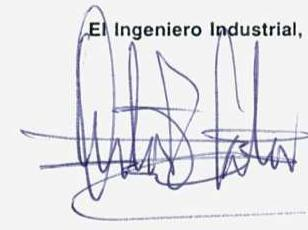
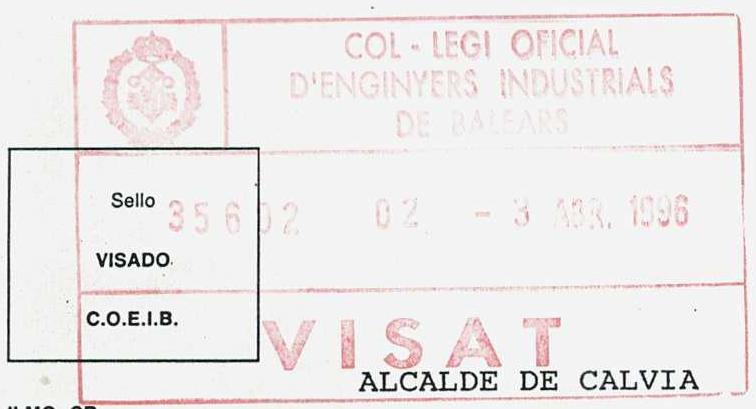

# CERTIFICADO DE DIRECCION DE OBRA Y/O INSTALACION 

## Expediente $\mathrm{n}^{\circ}$ $\qquad$ Organismo: $\qquad$

DON $\qquad$ ANTONIO SALOM MAS
Ingeniero Industrial, Colegiado $n^{\circ} .75$ en el COLEGIO OFICIAL DE INGENIEROS INDUSTRIALES DE BALEARES, Director de las obras relativas al:

PROYECTO: $\qquad$ DE ACONDICIONAMIENTO DE LOCAL DESTINADO A RESTAURANTE DE UN TENEDOR
Titular: GALOMA RESTAURACION, S.L.
Emplazamiento: AV. PEGUERA, S/N
Población: $\qquad$ CALVIA $\qquad$ 4.513 .800 $\qquad$ Ptas.

CERTIFICO:
Que dichas instalaciones ya terminadas, han sido realizadas bajo mi dirección, ajustándose al Proyecto redacido por MISMO $\qquad$ y visado por el Colegio Oficial de $\qquad$ INGENIEROS INDUSTRIALES DE BALEARES en fecha 11/ENERO/96 y $\mathrm{n}^{\circ} 35602$
habiéndose realizado las siguientes pruebas:
LA CARGA DE FUEGO PREVISTA ES DE 35 Mca1/m2
Las obras están de conformidad con la licencia municipal de instalación y se han tenido en cuenta las medidas correctoras previstas en el proyecto.
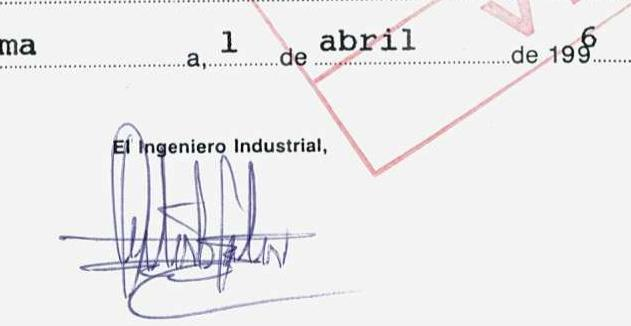

| Sello |
| :-- |
| VISADO |
| C.O.E.I.B. |

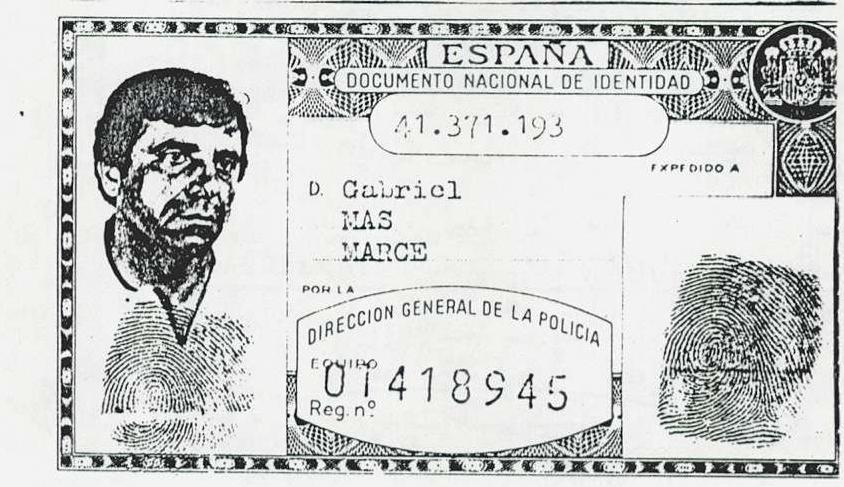

# 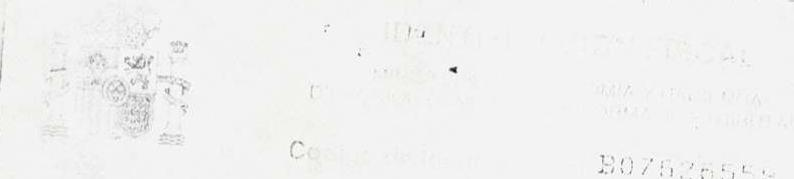 

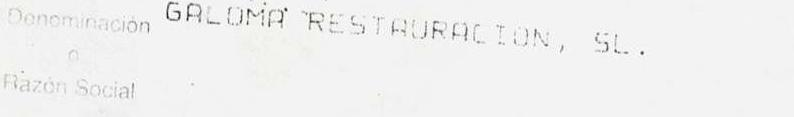

Demecio CL BRJR 1 Fiscal CALVIA
Actindal Pracipul CNAC 000
Gimmichnician 07600

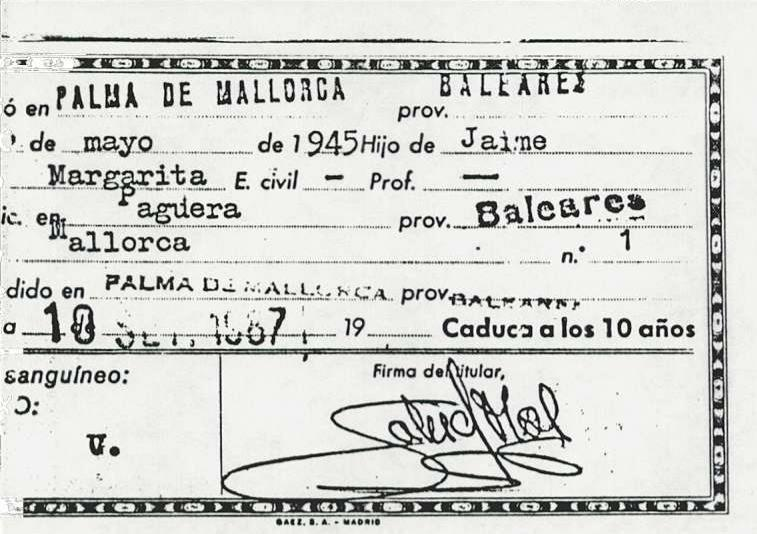

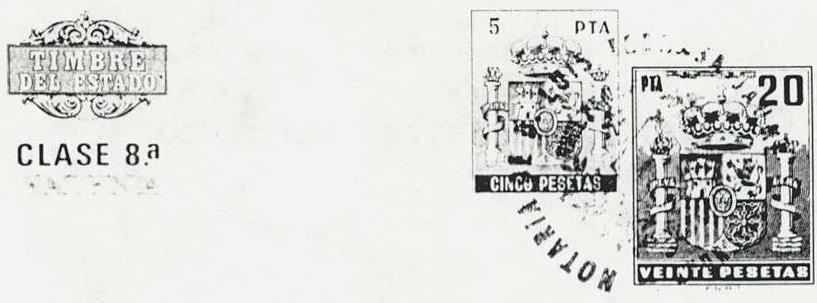

# CONSTITUCION DE SOCIEDAD LIMITADA. 

NUMERO SETECIENTOS OCHENTA Y CUATRO.

En Andraitx, mi residencia, a veintidós de Julio de mil novecientos noventa y tres.

Ante mi, LUIS TERRASA JAUME, Notario del Ilustre Colegio de Baleares, $\qquad$
$\qquad$ C O M P A R E E N : $\qquad$
DON GABRIEL MAS MARCE, nacido el día 10 de Mayo de 1.945, casado en régimen de separación de bienes, Industrial, vecino de Calviá, domiciliado en Paguera, calle Baja, número 1, y titular del D.N.I./N.I.F. número 41.371.193-N. $\qquad$
Y DOÑA MARIA DOLORES MARTIN LORENTE, nacida el día 9 de Enero de 1.949, casada en régimen de separación de bienes, sus labores, vecina de Calviá, domiciliada en Paguera, calle Baja, número 1, y titular del D.N.I./N.I.F. número 41.392.825-R. $\qquad$

Los señores comparecientes, a quienes identificopor su documentación reseñada y exhibida, concurrena este acto en su propio nombre y derecho; y tenien-

# Agencia Tributaria 

- Delegación de
- Administración de
- Codigo de Administración

MUNISTERO
IN ECONOMIA
Y HACIENDA

## Apartado I: Datos identificativos del sujeto pasivo

4 Espacio reservado para la etiqueta identificativa

| B07626559 | AOMON. -07600 |
| :--: | :--: |
| GALOMA RESTAURACION SL |  |
| CL BAJA, 1 |  |
| 07160 CALVIA | BALEARES |


| 8 N.I.F. | 5 Apellidos y nombre o razón social |  |
| :--: | :--: | :--: |
| B07626550 |  |  |
|  |  |  |

## Domicilio fiscal

11 S.G. 12 Nombre de la vía pública
CL BAJA
20 Cód. Postal 21 Municipio
07160

## 22 C. Vía 14 Núm. 15 Km . 16 Esc. 17 Piso 18 Pta. 19 Teléfono

22 C. Mun. 23 Provincia
24 C. Prov

## Apartado II: Representante

25 N.I.F.
26 Apellidos y nombre o razón social
41371193N
MAS MÁBCE, GABRTEL

## Domicilio

27 S.G. 28 Nombre de la vía pública
29 C. Vía 30 Núm. 31 Km .32 Esc. 33 Piso 34 Pta. 35 Teléfono
OL MALIJORCA
30 Cód. Postal 37 Municipio
07160

## 38 C. Mun. 39 Provincia

40 C. Prov.

## Apartado III: Datos de la actividad

41 Tipo de actividad: $\quad$ Empresarial $\quad$ Profesional $\quad$ Artística
Local afecto indirectamente
42 Descripción de la actividad:
RESTAURANTE I TENEDOR
45 Municipio
CALVIA
46 C. Myn. 47 Provincia
43 Grupo o epígrafe:
C-1 1
48 C. Prov

## Domicilio de la actividad:

49 S.G. 50 Nombre de la vía pública
AVUA. PALUERA (CALVICA) S.o 835 Núm.)
51C.Postal 52 Cód.Vía 53 Núm. 54 Km . 55 Pto. 56 Esc. 57 Piso 58 Pta. 59 Teléfono
(17101)

| 60 Notas que son de aplicación: | 61 Agrupación | 62 Grupo | 63 Epígrafe | 64 Activ. principal |
| :--: | :--: | :--: | :--: | :--: |
| 65 Regla(s) que son de aplicación: | Regla 4. ${ }^{\circ} 2$ F): | Regla 7. ${ }^{\circ}$ : |  |  |
| 66 Exención que solicita: | Art. 83. 1. d): | Art. 83. 1. e): |  |  |
| 67 Beneficios fiscales: |  | 68 \% Bonific.: |  | 69 Fecha límite: |
| 70 Fecha de inicio, variación o cese en la actividad, o en el uso del local indirectamente afecto: |  | $1-2-17 / 15$ |  |  |
| 71 Causa de la variación o baja: |  |  |  |  |
| 72 Causa de la declaración complementaria: |  |  |  |  |
| 73 Año en que inicio la actividad por $1 .{ }^{\circ}$ vez (solo profesionales): |  |  |  |  |
| 74 Información adicional: |  |  |  | 75 N. ${ }^{\circ}$ Ref.: |

## Apartado IV: Local afecto indirectamente a la actividad

76 Uso o destino: (Ver instrucciones)
(Almacén, depósito, centro de dirección, administración, cálculo, etc.)
Situación
77 Cód. Postal 78 Municipio
79 C. Mun. 80 Provincia
81 C. Prov
82 S.G. 83 Nombre de la vía pública
84 Cód.Vía 85 Núm. 86 Km . 87 Pto. 88 Esc. 89 Piso 90 Pta. 91 Teléfono

# AJUNTAMENT DE CALVIȦ MALLORCA 

## Expt. - 19/96-EC

DECRETO DE LA ALCALDIA.- A la vista de las actuaciones, informes favorables y documentación obrante en el expediente y, habida cuenta de que la instalación cumple los requisitos exigidos por la normativa vigente, esta Alcaldía resuelve conceder la licencia municipal de apertura y funcionamiento para
ACTIVIDAD: RESTAURANTE DE UN TENEDOR EMPLAZAMIENTO: AVENIDA DE PEGUERA, 52. URBANIZACION: PEGUERA
TITULAR: GALOMA RESTAURACION S.L.
debiéndose librar el correspondiente título de Licencia Municipal de Apertura de Establecimiento en el que figurarán las condiciones particulares así como las condiciones generales.

Condiciones Generales:18.- La presente licencia se entiende otrogada salvo el derecho de propiedad y sin perjuicio de tercero. 2․ No excluye la obligación de obtener cualquier otra licencia o autorización preceptiva, en caso de competencias concurrentes. 3․ La Licencia es transmisible, pero se requiere la previa autorización municipal. 4․ Toda ampliación, reforma, traslado, o alteración de la actividad por cualquier circunstancia, estará sujetas a licencia municipal. 5․ La actividad autorizada por la Licencia deberá ser desarrollada en la forma y condiciones que figuran en el Proyecto de la Instalación y en las demás establecidas por la legislación vigente. 6․ El incumplimiento de las condiciones a que está subordinada la Licencia, faculta a la Alcaldía para declararla sin efecto. 7․ Asimismo la Licencia podrá ser revocada y anulada, en los casos y siguiendo el procedimiento previsto o que se prevean en las Leyes, Reglamento y Ordenanzas Municipales. 8․ En casos de establecimientos abiertos al público, el presente Título deberá colocarse en lugar visible. 9․ El Titular viene obligado a facilitar la entrada a los servicios municipales de inspección y agentes de la autoridad para comprobar el correcto funcionamiento de la instalación.10․ Las instalaciones eléctricas deberán revisarse periódicamente por técnicos competentes debiendo expedir anualmente el boletín de reconocimiento cuyo duplicado será sellado por la Dirección General de Industria. (Circular C010693, BOCAIB núm. 80 de 3-7-90).

Lo manda y firma la Sra. Alcaldesa, en Calviá, a trece de junio de mil novecientos noventa y seis
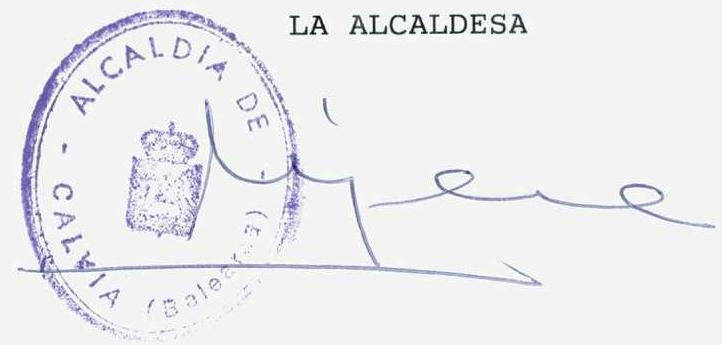

Esta Alcaldía, en el día de hoy, ha tenido a bien dictar el Decreto que a continuación le transcribo literalmente:
"DECRETO DE LA ALCALDIA.- A la vista de las actuaciones, informes favorables y documentación obrante en el expediente y, habida cuenta de que la instalación cumple los requisitos exigidos por la normativa vigente, esta Alcaldía resuelve conceder la licencia municipal de apertura y funcionamiento para ACTIVIDAD: RESTAURANTE DE UN TENEDOR
EMPLAZAMIENTO: AVENIDA DE PEGUERA, 52.
URBANIZACION: PEGUERA
TITULAR: GALOMA RESTAURACION S.L.
debiéndose librar el correspondiente título de Licencia Municipal de Apertura de Establecimiento en el que figurarán las condiciones particulares así como las condiciones generales.

Condiciones Generales:1a.- La presente licencia se entiende otrogada salvo el derecho de propiedad y sin perjuicio de tercero. 2a.- No excluye la obligación de obtener cualquier otra licencia o autorización preceptiva, en caso de competencias concurrentes. 3a.- La Licencia es transmisible, pero se requiere la previa autorización municipal. 4a.- Toda ampliación, reforma, traslado, o alteración de la actividad por cualquier circunstancia, estará sujetas a licencia municipal. 5a.- La actividad autorizada por la Licencia deberá ser desarrollada en la forma y condiciones que figuran en el Proyecto de la Instalación y en las demás establecidas por la legislación vigente. 6a.- El incumplimiento de las condiciones a que está subordinada la Licencia, faculta a la Alcaldía para declararla sin efecto. 7a.- Asimismo la Licencia podrá ser revocada y anulada, en los casos y siguiendo el procedimiento previsto o que se prevean en las Leyes, Reglamento y Ordenanzas Municipales. 8a.- En casos de establecimientos abiertos al público, el presente Título deberá colocarse en lugar visible. 9a.- El Titular viene obligado a facilitar la entrada a los servicios municipales de inspección y agentes de la autoridad para comprobar el correcto funcionamiento de la instalación.10a.- Las instalaciones eléctricas deberán revisarse periódicamente por técnicos competentes debiendo expedir anualmente el boletín de reconocimiento cuyo duplicado será sellado por la Dirección General de Industria. (Circular C010693, BOCAIB núm. 80 de 3-7-90)."

Contra la presente Resolución, que pone fin a la vía administrativa, podrá interponer RECURSO CONTENCIOSO ADMINISTRATIVO ante la Sala de lo Contencioso Administrativo del Tribunal Superior de Justicia de las Baleares, en el plazo de DOS MESES a contar desde el día siguiente al de la notificación de la presente, previa comunicación a la Alcaldía. Todo ello sin perjuicio de ejercitar, en su caso, cualquier otro recurso o acción que estime pertinente.
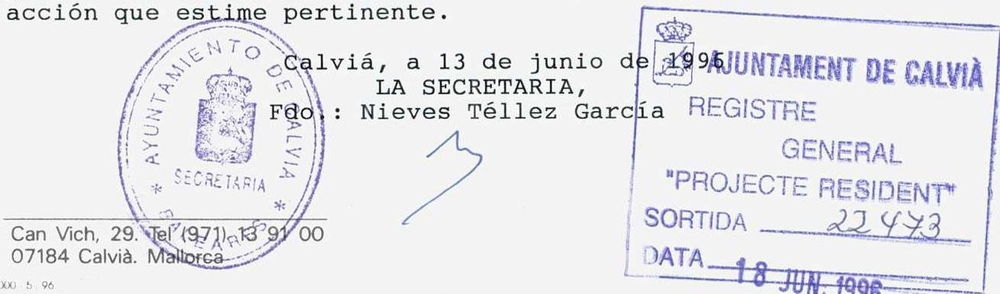

# TITULO DE <br> LICENCIA MUNICIPAL DE FUNCIONAMIENTO. 

## CONCEDIDA POR DECRETO DE LA ALCALDIA DE FECHA 13/06/1996

## A FAVOR DE GALOMA RESTAURACION S.L.

## PARA LA ACTIVIDAD DE RESTAURANTE DE UN TENEDOR

## EN AVENIDA DE PEGUERA, 52. PEGUERA

## CON CARACTER PERMANENTE

$=$ C OMD I C I OMES $=$
10.- La presente licencia se entiende otorgada salvo el derecho de propiedad y sin perjuicio de tercero.
20.- No excluye la obligación de obtener cualquier otra licencia o autorización preceptiva, en caso de competencias concurrentes.
30.- La Licencia es transmisible, pero se requiere la previa autorización municipal.
40.- Toda ampliación, reforma, traslado, o alteración de la actividad por cualquier circunstancia, estará sujetas a licencia municipal.
50.- La actividad autorizada por la Licencia deberá ser desarrollada en la forma y condiciones que figuran en el Proyecto de la Instalación y en las demás establecidas por la legislacion vigente.
60.- El incumplimiento de las condiciones a que está subordinada la Licencia, faculta a la Alcaldia para declararla sin efecto.
70.- Asimismo la Licencia podrá ser revocada y anulada, en los casos y siguiendo el procedimiento previsto o que se prevean en las Leyes, Reglamentos y Ordenanzas Municipales.
80.- En casos de establecimientos abiertos al público, el presente Título deberá colocarse en lugar visible.
90.- El titular viene obligado a facilitar la entrada a los servicios municipales de inspección y agentes de la autoridad para comprobar el correcto funcionamiento de la instalación.
100.- Las instalaciones eléctricas deberán revisarse periódicamente por técnicos compe tentes debiendo expedir anualmente el boletín de reconocimiento cuyo duplicado será sellado por la Dirección General de Industria. (Circular C10693, HOLA18 num. 80 de 3-7-90).
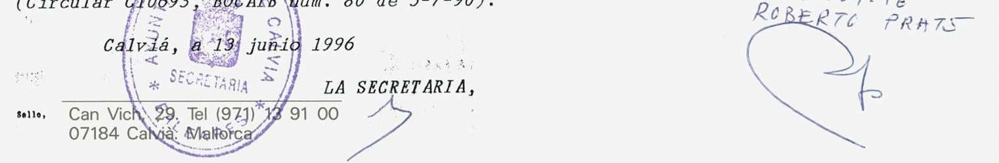

# SERVICIO DE CORREOS 

Oficina de origen del envío:
(que consignan los datos)

Envio n. ${ }^{\circ}$
depositado el
19
Clase del envío certificado
Valor declarado Ptas.
Giro Postal de Ptas. ${ }^{15}$
(3)
(1)
(2)
(3)

## AJUNTAMENT DE CALVIA

## C/ OTORGAMIENTO LICENCIA EXPTE 19/96-E6

Destinatario:
en
(1) Carta, impreso, eLAERIEL MAS MARCE
(2) Táchate hiprocetite
(3) Hace constarlo que se desea

07160 - CALVIA

## AVISO DE RECIBO

Mod. 35
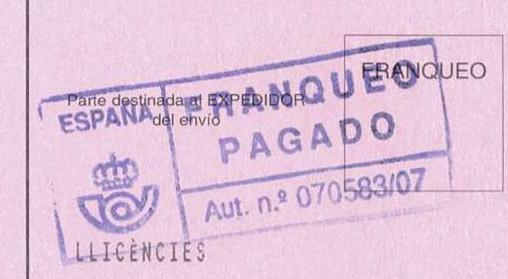

## ALUNTAMENT DE CALVIA

## CL. CA'N VICH, S/N.

07184 - CALVIA

BALEARS

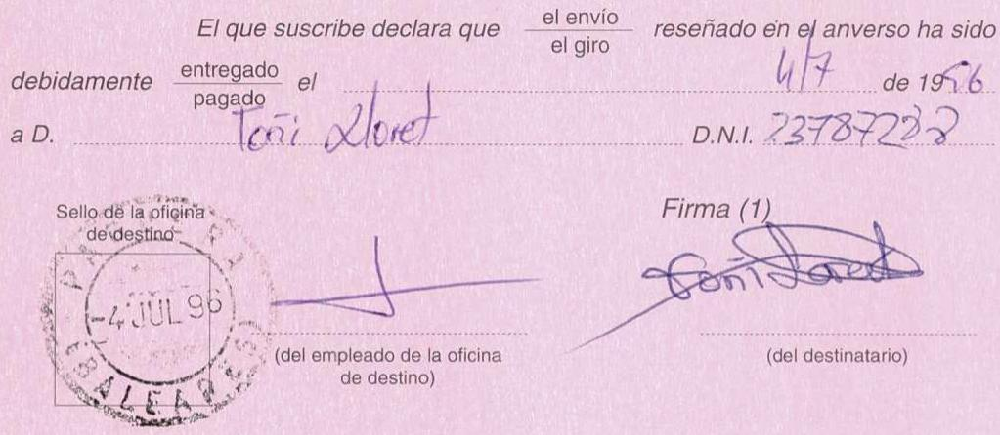
(1) Este aviso debe ser firmado por el destinatario o, persona autorizada en su caso, por el empleado de la oficina de destino y devuelto directamente por primer correo al remitente del envío a que corresponde.

# DOCUMENTOS 

1. MEMORIA
2. ESTADO DE MEDICIONES. PRESUPUESTO.
3. PLIEGO DE CONDICIONES.
4. PLANOS.

# 1. MEMORIA

# S U M A R I O <br> $==================$ 

1. OBJETO DEL PROYECTO
2. REGLAMENTACION APLICABLE
3. CARACTERISTICAS DEL LOCAL
3.1. VENTILACION
3.2. ASEOS
3.3. AGUA POTABLE
3.4. ALCANTARILLADO
4. DESCRIPCION DE LA ACTIVIDAD
5. MEDIDAS CORRECTORAS
6. REGLAMENTACION TECNICO SANITARIA DE COMEDORES COLECTIVOS
7. INSTALACION DEL G.L.P.
8. MAQUINARIA A INSTALAR
9. INSTALACION ELECTRICA
9.1. POTENCIA A INSTALAR
9.2. CARACTERISTICAS DE LA INSTALACION
9.3. ILUMINACION
9.4. CALCULOS ELECTRICOS
10. APLICACION DE LA NBE.CPI-91
10.1. Elementos no modificables sin afectar la seguridad contraincendios
10.2. Relación de elementos constructivos y materiales empleados
10.3. EF y RF exigibles a este local en aplicación de la NBE-CPI- 91
10.4. Compartimentación en sectores de incendio
10.5. Aforo del local y vías de evacuación
10.6. Medidas contraincendios
10.7. Extracción de humos

# 1. OBJETO DEL PROYECTO.- 

El presente proyecto tiene por objeto describir las obras e instalaciones a realizar en el acondicionamiento de local que tiene, actualmente, licencia municipal de Apertura de CAFETERIA cuya fecha es 16/marzo/87, para cambiar de actividad a restaurante de un tenedor.

Se pretende, asimismo, obtener las autorizaciones necesarias del Ayuntamiento de Calviá, Consellería de Industria y demás Organismos oficiales.

## 2. REGLAMENTACION APLICABLE.-

- Reglamentación de Actividades Molestas, Decreto 24/4/1961 de la Presidencia del Gobierno.
- Ordenanzas Municipales del Ayuntamiento de Calviá.
- Decreto 2/1.992 de 16 de Enero de la Consellería de Turismo por el que se regula la Oferta Turística Complementaria de esta Comunidad Autónoma.
- Reglamento Electrotécnico para Baja Tensión e Instrucciones Técnicas Complementarias.
- Reglamentación Técnico-Sanitaria de Comedores Colectivos R.D. $2817 / 1983$
- Ordenanza General de Seguridad e Higiene en el Trabajo.
- NBE-CPI-91


## 3. CARACTERISTICAS DEL LOCAL.-

El local está situado en planta baja en edificio destinado a locales y viviendas, teniendo construidas varias plantas encima de la plata baja destinada a locales comerciales.

Las superficies del local son las siguientes:

| Comedor | 60,60 |
| :-- | :-- |
| Cocina | 65,50 |
| Almacén y servicios | 40,20 |
| Sanitarios | 19,60 |

185,90 m2.

# 3.1. VENTILACION.- 

La ventilación del local se realizará a través del acceso exterior

Los servicios sanitarios se ventilarán directamente a través del almacén.

La cocina dispone de la turbina de extracción de humos.

El GLP está situado al exterior del local.

### 3.2. ASEOS.-

El local dispone de tres servicios sanitarios.

El de caballeros, dotado de dos inodoros y un lavabo.

El de señoras, dotado de dos inodoros y un lavabo.

El del personal propio, dotado de un inodoro, un lavabo y una ducha.

### 3.3. AGUA POTABLE.-

El local dispone de agua potable proveniente de la red municipal.

### 3.4. ALCANTARILLADO.-

Las aguas negras desaguan a través de una cámara de grasas a la red municipal de alcantarillado.

## 4. DESCRIPCION DE LA ACTIVIDAD Y CUMPLIMIENTO DEL DECRETO 2/1992 SOBRE REGULACION DE LA OFERTA TURISTICA COMPLEMENTARIA.

Será la propia del restaurante, sirviéndose platos en la barra y en las distintas mesas que se colocarán en el salón y terraza. Respecto al personal necesario, dado el tamaño del local y el número de mesas, se considera suficiente con tres personas, que

se aumentará a cuatro en temporada alta.

La categoría de la licencia que se solicita es de UN TENEDOR (Cuarta Categoría), por lo que la actividad deberá adaptarse a las exigencias del ANEXO 1 punto 2.5. del mencionado decreto.

- Número máximo de plazas para una superficie de salón de $60 \times 60 \mathrm{~m} 2$. a razón de $1,5 \mathrm{~m} 2$. por cliente $=40$ plazas.
- Se ha previsto la instalación de un teléfono público.
- Se instalarán aseos separados por sexos, cubriéndose las especificaciones mínimas que se indican en el anexo.
- La zona del almacén (servicios) es de $40,20 \mathrm{~m} 2$. mayor que el $25 \%$ de la superficie del comedor $60,60 \mathrm{~m} 2$.
- El fregadero será de dos senos, con agua fría y caliente, igualmente los lavabos de los aseos dispondrán de agua fría y caliente, jabón líquido y secamanos por aire caliente.


# 5. MEDIDAS CORRECTORAS.- 

Toda la maquinaria a instalar y que por sus características pueda producir vibraciones, se montará sobre apoyos antivibratorios de goma, capaces de eliminar dichas vibraciones. Se tendrá en cuenta lo dispuesto en el Art. ll decreto 20/1987 B.O.C.A.I.B. N. 54

El TV que se instalará se graduará a tal volumen que no se llegue a los $30^{\circ} \mathrm{dB}$, medidos a un metro de distancia en todo el perímetro del local.

La campana para humos dispondrá del correspondiente sistema de filtros decantadores de grasas, con la eficacia suficiente como para garantizar la no emisión de humos o vahos.

La salida se ralizará al exterior, un metro por encima de cualquier edificación u obstáculo situado en un radio inferior a 8 m . . A este fin emplearemos la correspondiente turbina y un conducto de sección adecuada hasta terminar un metro por encima

de la azotea del edificio.

Las zonas de manipulación de alimentos cumplirá con el C.A.E. y especialmente con la Reglamentación Técnico-Sanitaria de Comedores Colectivos, cuyos puntos más importantes se reflejan en el apartado siguiente.

La instalación interior de gas responderá a las especificaciones que se enumeran en Reglamento de Instalaciones de Gas locales destinados a usos domésticos, colectivos o comerciales y que reflejamos en el apatado 7 de esta memoria.

La instalación eléctrica se ajustará al R.E.B.T. e Instrucciones Complementarias. Tal como se verá en el apartado 8.

Se cumplirá la NBE-CPI-91. Según estudio que se realiza en el apartado 10 .

# 6. REGLAMENTACION TECNICO - SANITARIA DE COMEDORES COLECTIVOS 

## Cocina:

Suelo con embaldosado de cerámica, gres o baldosa vitrifacada de cualquier tipo.

Paredes azulejadas hasta el techo, de color claro.

Uniones de paramentos horizontales y verticales redondeados para facilitar su limpieza.

Sumidero con cierre sifónico y rejilla metálica, el suelo tendrá las pendientes adecuadas para que cualquier líquido vertido alcance el citado sumidero.

La ventilación se realizará por turbina extractora con un caudal aproximado de $3.000 \mathrm{~m} 3 /$ hora y dos huecos no obturales provistos de rejilla fina metálica que impida la entrada de roedores o insectos.

El fregadero que se instalará dispondrá de agua caliente y fría,

también se instalará un lavamanos con grifo pedal. Se dispondrá de secamanos o toallas de un solo uso, así como dispensador de jabón líquido.

Los residuos se guardarán en un cubo de goma dotado de tapadera, que se guardará en el interior del mueble fregadero. Este cubo se vaciará y lavará diariamente con productos adecuados.

Los frigoríficos y congelador que se instalarán tendrán la capacidad suficiente para las necesidades de este restaurante.

El alumbrado se realizará por medio de 4 tubos fluorescentes de 40W, montados en luminaria de fácil limpieza y con la protección adecuada para que en caso de rotura de uno de los tubos los alimentos no resulten contaminados.

# Zona Salon : 

Las paredes, suelos, techos, ventanas, carpintería y decoración serán de tal tipo que puedan ser lavados sin deterioro.

## Personal:

Respecto a las condiciones a cumplir por el personal afecto a la actividad y las medidas generales higiénicas, estaremos a lo dispuesto por el Código Alimentario Español y por la presente Reglamentación T-S de Comedores Colectivos.

## 7. INSTALACION DE G.L.P.-

El único consumidor de G.L.P. que se instalará será una cocina de tipo semi-industrial con una potencia aproximada de 20.000 Kcal/hora. Para su alimentación se emplearán dos botellas de tipo industrial conectadas en paralelo.

Estas botellas se instalarán al exterior del local en un armario de albañilería cerrado con una persiana de aluminio.

La conexión a la cocina se hará por medio de tubo de cobre.

# 8. MAQUINARIA A INSTALAR. - 

El equipamiento a instalar es el que sigue a continuación:
1 FREGADERO IND. SOBERANA INOX. MOD. 116/11I
2 BASTIDOR IND. SOBERANA INOX.MOD. BS/116
3. EXPENDEDOR DE CERVEZAS Y COLAS
4. MAQUINA DE CUBITOS ITV MOD. PULSAR 45 AIRE.
5. BOTELLERO INOX. 2 M.
6. BOTELLERO 2,50 M.
7. MUEBLE CAFETERO INOX. 1300X600X1050 MOD. 1210
8. MONTADORA DE NATA BAYNAT
9. BAJO MOSTRADOR 1500 INOX.
10. CONSERVADORA DE HELADOS
11. MUEBLE VAJILLERO INOX. 1500X300X1050 MOD. 1203
12. MOLINILLO CAFE
13. CAFETERA FAEMA
14. MUEBLE VAJILLERO INOX 2000X300X1050 MOD. 1203
15. MESA INOX. 300X700
16. MESA TRABAJO INOX. 1600X700
17. CORTADORA DE FIAMBRES
18. ARMARIO FRIGORIFICO
19. CAMPANA DE EXTRACCION INOX. DE 2000X1400
20. MESA INOX. APOYO 900X500
21. FREIDORA VALENTINE MOD. 7-5
21. FREIDORA VALENTINE MOD. 7-5
22. LAVAVAJILLAS SAMMIC LV-1200
23. MESA INOX. PRELAVADO 1150 CON FREGADERO, TOLVA DUCHA Y PARRILLA TRABAJO.
24. MESA INOX. DE SALIDA LAVADO
25. FREGADERO INOX.
26. HORNO CONVECCION
27. ENCIMERA INOX. EN ANGULO DE 4000X600
28. ENCIMERA INOX. EN ANGULO DE 8600X600

## 9. INSTALACION ELECTRICA.-

La tensión de suministro será 380 V entre fases.

# 9.1.POTENCIA A INSTALAR 

A continuación se detalla la potencia a instalar

- Fuerza motriz
- Horno convección ..... 3.000
- bajo mostrador frigorífico. ..... 230
- montadora de nata ..... 140
- baño maría ..... 2.000
- cafetera Faema ..... 2.800
- cafetera Melita ..... 2.000
- botellero 2,00 m. ..... 250
- botellero 2,50 m. ..... 300
- molinillo de café ..... 200
- cortadora fiambres ..... 200
- freidora Valentine ..... 4.000
- freidora Valentine ..... 4.000
- lavavajillas cocina ..... 9.500
- lavavasos Fagor ..... 3.340
- extracción de humos ..... 1.000
- termo de agua caliente ..... 1.500
- cámara frigorífica ..... 900
- 3 bases usos varios ..... 3.000
- Alumbrado
apliques
alumbrado local
terraza
alumbrado depend.
4 bases alumbrado
$5 \times 60 \mathrm{~W}=$ 300 W
$8 \times 4 \times 36 \mathrm{~W}=$ 1.152 W
$18 \times 60 \mathrm{~W}=$ 1.080 W
$5 \times 2 \times 20 \mathrm{~W}=$ 200 W
$2.000 \mathrm{~W}$
$4.732 \mathrm{~W}$
Potencia de cálculo
coeficiente simultaneidad
potencia a contratar
$44.937 \mathrm{~W}$
$0,80$
$41.600 \mathrm{~W}$

# 9.2. CARACTERISTICAS DE LA INSTALACION.- 

El cuadro general se alimentará directamente de la batería de contadores del edificio a través de una derivación individual de cable tipo subteflex de $4 \times 16 \mathrm{~mm} 2$. . Una línea de $4 \times 6 \mathrm{~mm} 2$ alimentará un subcuadro con lo que se consigue una distribución de cargas más conveniente.

Puede verse en el esquema el detalle de las protecciones diferenciales y magnetotérmicas.

El local objeto del presente proyecto se encuentra clasificado en el R.E.B.T. como LOCAL DE REUNION, por lo que se tomarán las siguientes medidas.

No se montarán bases de enchufe o interruptores de forma que sean fácilmente accesible para el público.

Se instalará alumbrado de Emergencia y señalización.

## Conductores

Todos los conductores tendrán una tensión de aislamiento de 750 V con doble capa aislante, excepto la derivación individual que será de PRC+PVC 1 KV. Serán de cobre rígido. Las secciones serán en cada caso las que se indican en los esquemas.

## Tubos

Para empotrar del tipo flexible corrugado, no propagadores de la llama, resistencia al impacto de 3 julios. En superficie se emplearán tubos rígidos, curvables, no propagadores de la llama y con una resistencia al impacto de al menos 5 julios.

Protecciones. Interruptores magnetotérmicos y diferenciales normalizados para montar en rail DIN, debidamente homologados. Sus características serán las indicadas en el esquema.

Tomas de corriente

Todas las tomas de corriente estarán provistas de tomas de tierra y podrán soportar una intensidad de corriente dos veces superior a la solicitada por el consumidor al que alimentar.

# Luminarias 

Las situadas en el exterior estarán protegidas de la lluvia (IP33) Las situadas en zonas de manipulación de alimentos estarán protegidas de las roturas de los tubos fluorescentes para que en ningún caso puedan contaminarse los alimentos.

## Tomas de tierra

Los conductores de tierra se conectarán a la tierra general existente en la batería de contadores. Se tendrá especial precaución en que todas las masas metálicas estén debidamente conectadas a esta red general de toma de tierra.

### 9.3. ILUMINACION.-

El nivel de iluminación para la zona del comedor será de 300 lux. El nivel cocina será de 500 lux.

### 9.4. CALCULOS ELECTRICOS.-

Las fórmulas que se han utilizado para los cálculos de las líneas eléctricas son los siguientes:

Línea mono o doble monofásica $E=\frac{2 x L x I x 100}{56 x S x V}$

$$
I=\frac{W}{V}
$$

$$
\begin{aligned}
& \text { i. } 73 \times \text { LxIx100 } \\
& \text { 56xSxV } \\
& \text { W } \\
& \text { 1. } 73 \times \text { V }
\end{aligned}
$$

siendo:
W = Potencia en vatios
I = Intensidad en amperios
S = Sección del conductor en mm2.
L = Longitud de la línea en metros
e = Caída de tensión en \%

# 10. APLICACION DE LA NBE.CPI.91.- 

La actividad objeto del presente proyecto no figura en los anejos de Condiciones Particulares de Uso de esta norma, por lo que hay que adaptarse a las Condiciones Generales.

### 10.1 Elementos no modificables sin afectar la seguridad contraincendios.

Al no existir compartimentación en sectores de incendio, sectores protegidos o zonas de riesgo especial, vestíbulos previos, vías de evacuación protegidas, etc. tampoco existen elementos que no se puedan modificar, si exceptuamos las propias paredes perimetrales y las puertas de acceso.

### 10.2 Relación de elementos constructivos y materiales empleados

Estructura de pilares de hormigon armado con 40 cm . de sección transversal y $2,5 \mathrm{~cm}$. de recubrimiento en armaduras, enlucido de 1 cm . de yeso. EF-120. Forjados reticulares de 25 cm . de espesor con viguetas y bovedillas pavimento de baldosa y enlucido de yeso EF-120

Todas las paredes medianeras como los cerramientos exteriores son de bloque de hormigon vibrado de 20 cm . de espesor y $1,5 \mathrm{~cm}$. de recubrimiento de yeso o mortero de cpa RF>90

# 10.3 EF y RF exigibles a este local en aplicación de la NBE-CPI-91 

Según el art. 14 tabla 1, al forjado del techo se le exige una EF-120 (alturas de evacuación iguales o inferiores a 28 m . en locales de pública concurrencia), se exige RF-60 como mínimo. Al suelo no se le exige ninguna EF al no existir sótano.

Respecto a recubrimientos decorativos, el máximo grado de combustibilidad será el siguiente:

- Ml para materiales sueltos o flotantes
- M2 para techos
- M2 para paredes, con un máximo del lo\% de la superficie de M3 siempre que su distribución sea uniforme
- M3 para suelos
(Todo ello según circular núm. 14579/10315 sobre interpretación del RD 2816/1982)


### 10.4. Compartimetación en sectores de incendio.

Por sus dimensiones y actividad, este local constituirá un solo sector de incendio.

### 10.5. Aforo del local y vías de evacuación

La superficie total del local es de 185,90m2.. Considerando una ocupación de una persona por cada $1,5 \mathrm{~m} 2$. y una por cada 10 m 2 . en zonas de servicios resultará:

| Comedor | 60,60 | m 2 . | $:$ | $1,5 \mathrm{~m} 2$. | $=$ | 40 |
| :-- | :-- | :-- | :-- | :-- | :-- | :-- |
| Servicios | 125,30 | m 2 . | $:$ | 10 m 2 . | $=$ | 12 |

Para cumplir con las condiciones expresadas en el art.7.2 de la NBE CPI-91 basta con una puerta de salida de 1,20 m. dos hojas, eje de giro vertical y apertura en el sentido de la salida y fácilmente operable.

Dicha vía cumple con lo previsto en la NBE-CPI-91 punto 7.4.2.a., 7.4.3. y 8.1.a. así como con lo dispuesto en esta materia en el Reglamento General de Policía de EP y AR. También se adapta a lo indicado en el punto 6 de la circular no 14590/10323 de la Delegación del Gobierno de la Comunidad Autónoma de las Islas Baleares.

# 10.6. Medidas contraincendios. 

Ni el local, ni ninguna de sus zonas se encuentran clasificadas como de riesgo especial en el art. 19. Se exigen únicamente extintores móviles.

Se exige un extintor de grado de eficacia $8 \mathrm{~A}-34 \mathrm{~B}$ por cada 15 m. de recorrido o 300 m 2 . en locales diáfanos (art. 20.1) Se instalarán los siguientes:

Salón comedor: dos de polvo seco 6 kgs
Cocina: tres de polvo seco 6 kgs
almacén: uno de polvo seco y dos automáticos ( rociadores ) + uno de CO2, junto al cuadro eléctrico.

Estos extintores llevarán indicación visible del estado de carga, peso y características. Se revisarán anualmente por personal especializado.

Se ubicarán en el lugar indicado en los planos adjuntos y a una altura de $1,5 \mathrm{~m}$. medidos sobre el pavimento del local.

### 10.7. Extracción de humos

En cumplimiento del art. 18.3 se realizará de la siguiente manera:

## Campana:

De chapa galvanizada, no existiendo a menos de 15 cm . de ella matcrial combustible no protegido.

# Conducto: 

Del mismo material y exclusivo para este tin; describirá el recorrido que puede verse en el plano de sección.

## Filtros:

Tres de $0,5 \times 0,5$ metálicos, lavables, fácilmente accesibles, desmontables, con bandeja de recogida de grasas y conducto hasta depósito de menos de 3 l. de capacidad.

## Turbina:

Uniones estancas con el conducto. Estas uniones serán MO. Podrá trabajar con temperaturas de hasta $400^{\circ} \mathrm{C}$, La cantidad de aire filtrado se estima en unos $3.000 \mathrm{~m} 3 /$ hora.

Palma de Mallorca, diciembre de 1.995

El Propietario

GALOMA RESTAURACION,S.L.
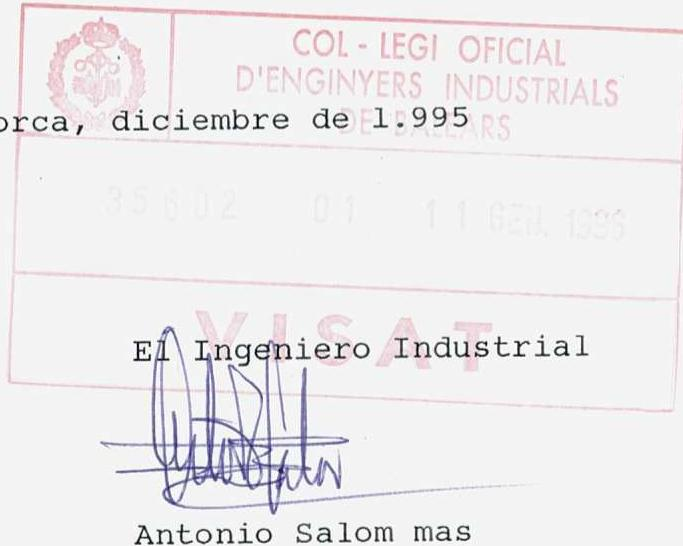

# 2. ESTADO DE MEDICIONES. PRESUPUESTO.

PROYECTO DE ACONDICIONAMIENTO DE LOCAL DESTINADO A RESTAURANTE DE UN TENEDOR ESTADO DE MEDICIONES Y PRESUPUESTO GALOMA RESTAURACION,S.L. PEGUERA ( CALVIA )

# CAP 1 ELECTRICIDAD 

1 Armario para cuadro eléctrico, de acuerdo con la normativa vigente, instalado, mínimo 60 elementos, incluso accesorios para la instalación, montaje y cableado. CUADRO GENERAL
80.000
80.000

1 Armario para cuadro eléctrico, de acuerdo con la normativa vigente, instalado, mínimo 60 elementos, incluso accesorios para la instalación, montaje y cableado. SUBCUADRO
80.000
80.000

9 Interruptor diferencial $4 \times 25 / 0,3 \mathrm{~A}$
1 Interruptor magnetotérmico $4 \times 63 \mathrm{~A}$
2 Interruptor magnetotérmico $4 \times 35 \mathrm{~A}$
4 Interruptor magnetotérmico $4 \times 16 \mathrm{~A}$
1 Interruptor magnetotérmico $4 \times 25 \mathrm{~A}$
4 Interruptor magnetotérmico $2 \times 16 \mathrm{~A}$
14 Interruptor magnetotérmico $2 \times 10 \mathrm{~A}$
2 Interruptor magnetotérmico $2 \times 6 \mathrm{~A}$
460.000

6 Punto de luz constituido por una luminaria fluorescente $4 \times 36 \mathrm{w}$, regleta standard, incluso equipo de arranque, incluso canalización eléctrica, instalada.
15.800

94.800

4 Punto de luz constituido por una luminaria fluorescente $2 \times 36 \mathrm{w}$, regleta standard, incluso equipo de arranque, incluso canalización eléctrica, instalada.

PROYECTO DE ACONDICIONAMIENTO DE LOCAL DESTINADO A RESTAURANTE DE UN TENEDOR ESTADO DE MEDICIONES Y PRESUPUESTO
GALOMA RESTAURACION,S.L. PEGUERA ( CALVIA )

1 Partida Alzada de canallzaclón eléctrica, para suministro a SUBCUADRO incluyendo, conductores,tubo protector, mecanismos auxillares, conexionado según maniobra prevista, parte proporcional de mano de obra y pequeño mate
220.000

TOTAL CAP 1 ELECTRICIDAD . . .
2.287 .300

CAP 2 EQUIPAMIENTO
EXPENDEDOR DE CERVEZAS Y COLAS
MAQUINA DE CUBITOS ITV MOD PULSAR 45 AIRE
BOTELLERO INOX 2 M.
BOTELLERO INOX 2,50 M.
MUEBLE CAFETERO INOX MOD 1210
MONTADORA DE NATA BAYNAT
BAJO MOSTRADOR 1500 INOX
CONSERVADORA DE HELADOS
MUEBLE VAJILLERO INOX MOD 1202
MOLINILLO DE CAFE
CAFETERA FAEMA
MUEBLE VAJILLERO INOX MOD 1203
CORTADORA DE FIAMBRES
ARMARIO FRIGORIFICO
CAMPANA DE EXTRACCION INOX DE 2000X1400
FREIDORA VALENTINE MOD T-5
FREIDORA VALENTINE MOD T-5
LAVAVAJILLAS SAMMIC LV-1200
HORNO CONVECCION

PROYECTO DE ACONDICIONAMIENTO DE LOCAL DESTINADO A RESTAURANTE DE UN TENEDOR ESTADO DE MEDICIONES Y PRESUPUESTO
GALOMA RESTAURACION,S.L. PEGUERA ( CALVIA )

UDS. CONCEPTO P.U. TOTAL

# CAP 3 EXTINCION DE INCENDIOS 

6 Extintor manual de polvo polivalente ABC de 6 kgs eficacia 13A-89B con anclajes y montado

9.000
54.000

1 Extintor manual de CO2 de 3.5 kgs , eficacia 13A-89B con anclajes y montado.

12.500

12.500

2 Extintores automáticos, rociadores
30.000
60.000

TOTAL CAP 3 EXTINCION DE INCENDIOS
126.500

CAP 4 VARIOS
1 Puerta RF-60, 72 cms ancho via, incluso resorte de cierre, marco y anclajes, cerradura/plcaporte de seguridad, accesorios y montaje
50.000
50.000

PROYECTO DE ACONDICIONAMIENTO DE LOCAL DESTINADO A RESTAURANTE DE UN TENEDOR ESTADO DE MEDICIONES Y PRESUPUESTO
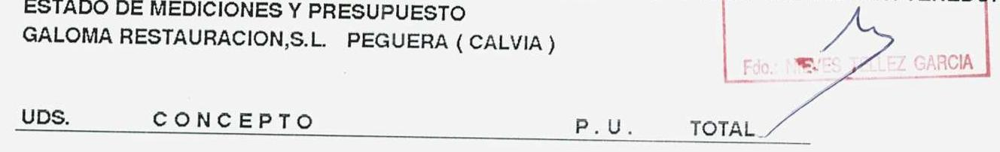

RESUMEN PRESUPUESTO

CAP 1. ELECTRICIDAD
CAP 2. EQUIPAMIENTO
CAP 3. EXTINCION DE INCENDIOS . . . 126.500

CAP 5. VARIOS
50.000

TOTAL PRESUPUESTO
4.513.800

Palma de Mallorca, diciembre de 1.995

EL PROPIETARIO

GALOMA RESTAURACION, S.L.
ANTONIO SALOM MAS

# 3. PlIEGO DE CONDICIONES.

# PLIEGO DE CONDICIONES 

## 1. CONDICIONES GENERALES

Las obras objeto de este Proyecto están definidas en el documento de Planos así como en el Estado de Mediciones que se acompañan.

El Director de esta obra se reserva el derecho de introducir, durante el transcurso de la obra, variaciones en los planos ó en las especificaciones del estado de mediciones. Esta variación, que deberá ser tenida en cuenta por el contratista, podrá implicar un cambio ó no en los precios unitarios dependiendo del acuerdo establecido entre la Propiedad y el Contratista en el contrato de la obra.

La Propiedad dará instrucciones al Ingeniero Director en relación a la Recepción provisional y definitiva de las obras. Si no median instrucciones al respecto, el Ingeniero Director únicamente certificará el Final de Obra.

La Propiedad deberá informar la forma en que la obra ha sido adjudicada al Contratista, a través del oportuno contrato.

En concreto, esta información se referirá a plazos de terminación, forma de pago, plazos de garantía de las instalaciones, forma de resolver los litigios, así como los trámites con los diversos Organismos de la Administración.

El Contratista estará obligado a adoptar todas las medidas de seguridad posibles para evitar, a toda costa, los accidentes laborales. Las consultas que en materia de adopción de medidas de seguridad se dirijan al Ingeniero Director deberán ser por escrito.

# 2. CONDICIONES GENERALES DE INDOLE TECNICO 

Cualquier variación en los materiales y forma de ejecución respecto a lo especificado en el Estado de Mediciones deberá ser autorizado por el Ingeniero Director de la Instalación.

Serán de cuenta del Contratista los siguientes trabajos y suministros y estarán incluidos en el precio de la adjudicación.

Ejecución de planos de montaje, que deberá someter a la aprobación de la Dirección Técnica. Esta aprobación, así como las que sigan, será general y no relevará en modo alguno al Contratista de la responsabilidaad de errores y de la necesidad de comprobación de planos por su parte.

Ejecución de planos de albañilería y obra civil relativos a las instalaciones, que deberá someter a la aprobación de la Dirección Técnica.

Preparación de planos de taller detallados por todos los trabajos que lo necesiten o que sean requeridos por la Dirección Técnica.

Suministro de todos los equipos, materiales y accesorios necesarios para la correcta ejecución de la Instalación. En este concepto se considerarán igualmente incluidos todos los soportes y elementos de sujeción y anclaje, si como aquellos accesorios y complementos que, aún no mencionándose expresamente en los documentos del proyecto al especificar los distintos materiales, sea de uso obligado o necesario a juicio de la Dirección Técnica.

Montaje por personal cualificado de todas las instalaciones cumpliendo con

todas las normas oficiales vigentes, coordinando esta instalación con las restantes y con la propia obra civil.

Limpieza final, pintura, pruebas, etc. puesta a punto y entrega de las obras.

Entrega de un Manual de Instrucciones de Funcionamiento, incluyendo catálogos e instrucciones de fabricantes de los diversos equipos y sus certificados de garantía, así como colección completa de planos de la obra terminada y demás documentos integrantes del proyecto de obra ejecutada.

Preparación técnica del personal de mantenimiento de la Propiedad.

Reparación de averías producidas durante el periodo de garantía, atribuidas a defectos de materiales ó de montaje.

Pruebas y ensayos necesarios para demostrar el funcionamiento adecuado de la instalación.

El Ingeniero Director se reserva el derecho de rechazar cualquier material ó método de ejecución de una unidad de obra que, a su juicio, sea inadmisible para cumplir las condiciones que se le exigen en este proyecto.

# 3. CONDICIONES GENERALES DE INDOLE ADMINISTRATIVO 

Las cifras expresadas en el Estado de Mediciones se dan a título orientativo y, por lo tanto, el Contratista no podrá alegar por omisiones ó inexactitudes aparecidas en él.

El Contratista deberá comunicar por escrito al Ingeniero Director del comienzo de las obras con dos semanas como mínimo de antelación.

En la inspección previa al final de las obras, el Contratista prestatá su colaboración, tanto personal como de medios auxiliares, para facilitar fal labor de inspección al efecto de probar que la instalación cumply el objetivo previsto en el proyecto.

Palma de Mallorca, diciembre de 1.995:ERS INDUSTRIALS DE BAIEARS

35602 01 11084 1996

La Propiedad:

El Ingeniero Industrial
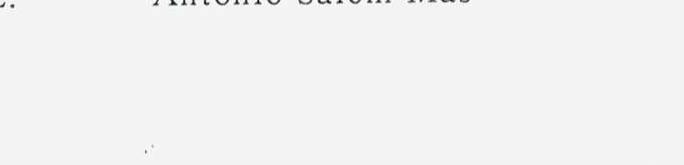

Antonio Salom Mas

# 4. PLANOS

# PLANOS 

1- SITUACION
2- PLANTA ACTUAL
3- PLANTA GENERAL
4- PLANTA FUERZA MOTRIZ
5- PLANTA ALUMBRADO
6- EMERGENCIAS Y EXTINTORES
7- SECCION
8- ESQUEMA ELECTRICO

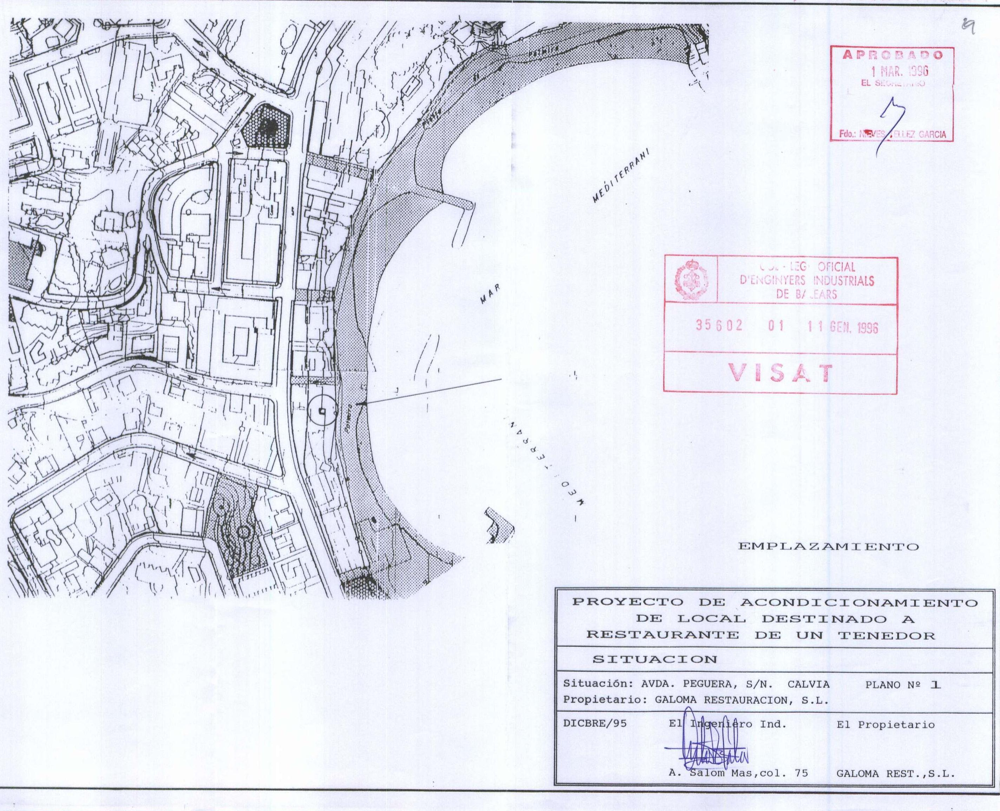

ACCESO PEATONAL DESDE LA AVDA. PESUERA
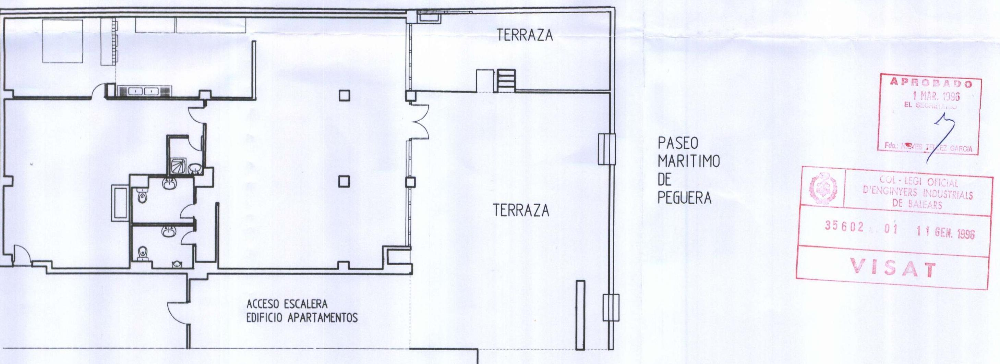

PASEO MARITIMO DE
PESUERA

PROYECTO DE ACONDICIONAMIENTO DE LOCAL DEBTINADO A RENTAURANTE DE UN TEMEDOR

PLANTA ACTUAL
Efroación: AVDA. PESUERA, S/N. CALVIA PLANO N 2
Propletario: GALOMA RESTAURACION, S.L.
DICERE/95
El Prodefrero Ind.
El Propletario
EACA
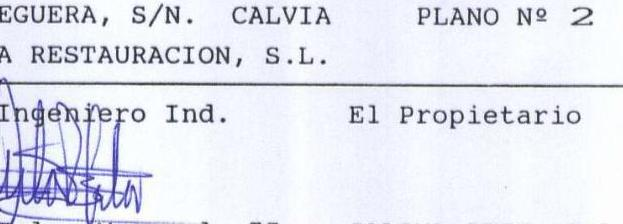

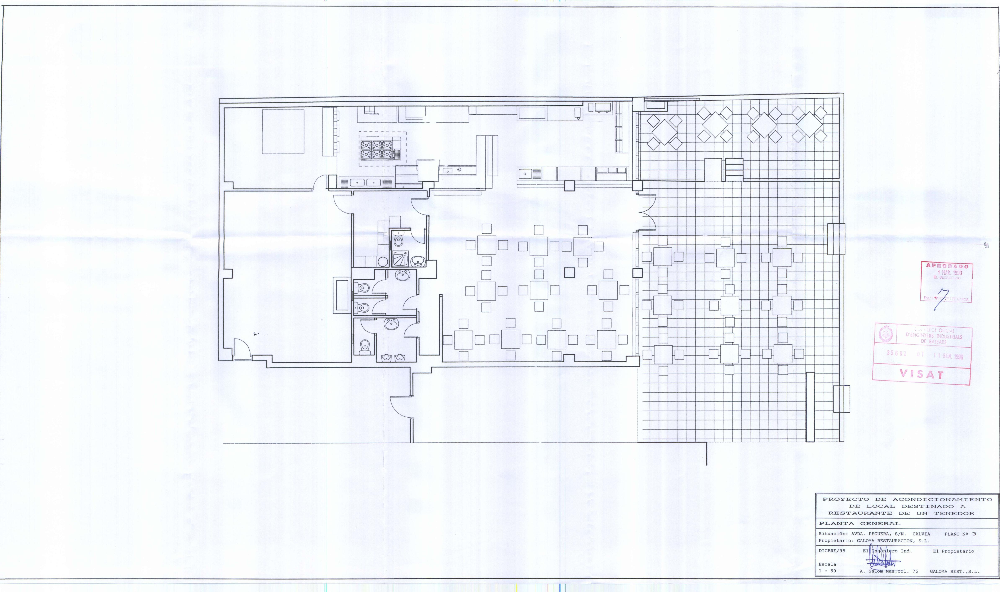

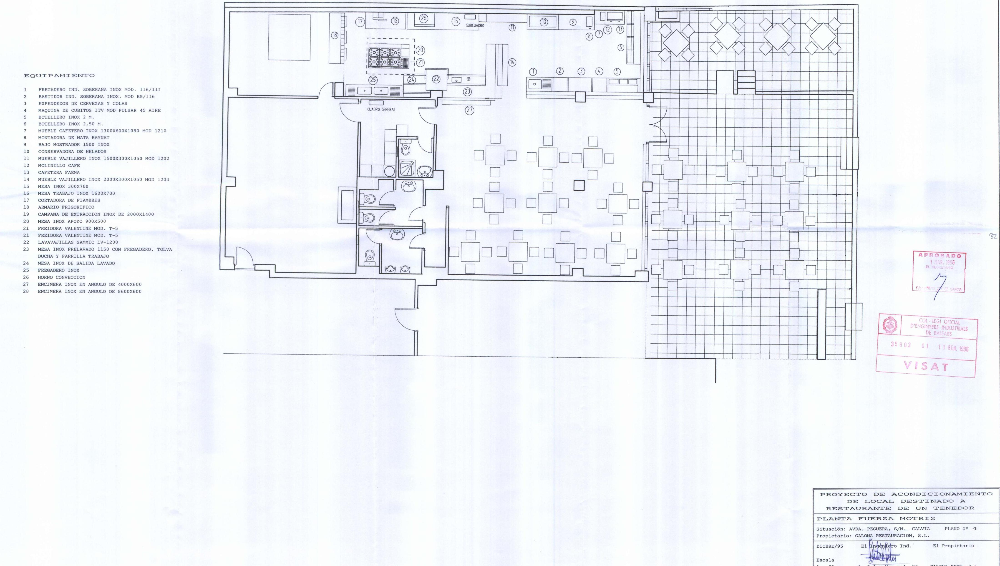

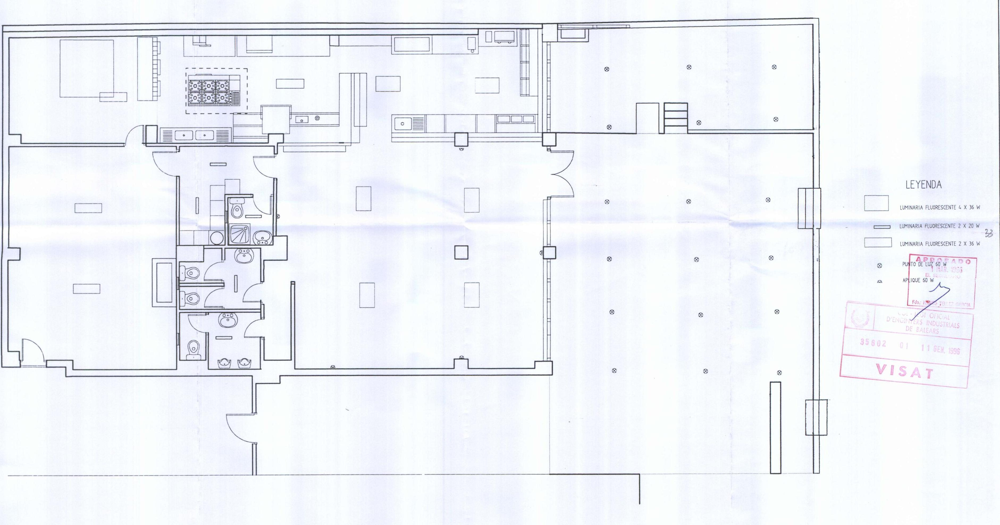

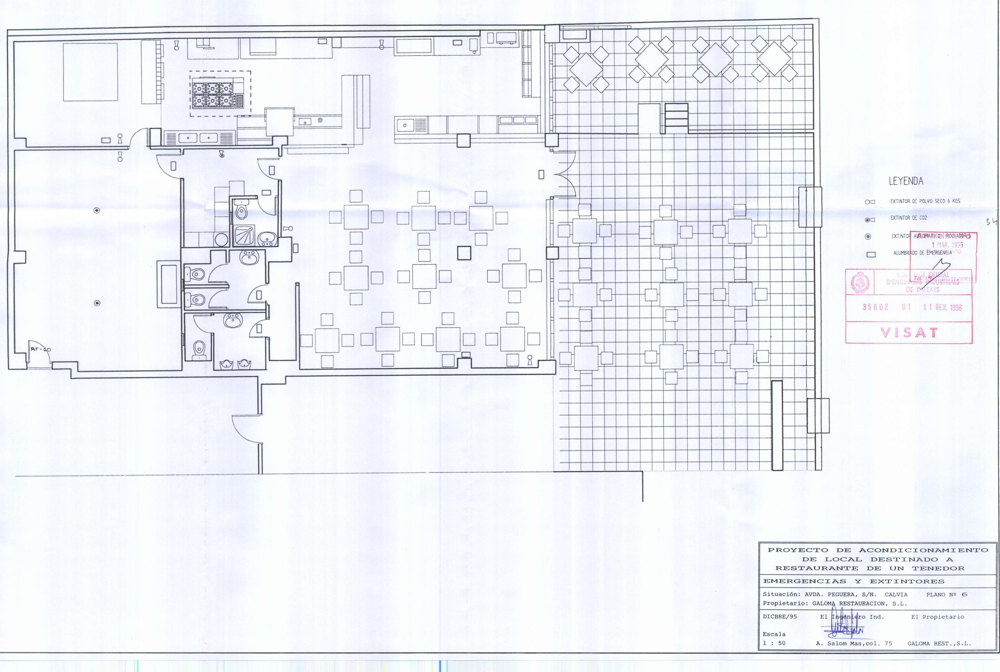

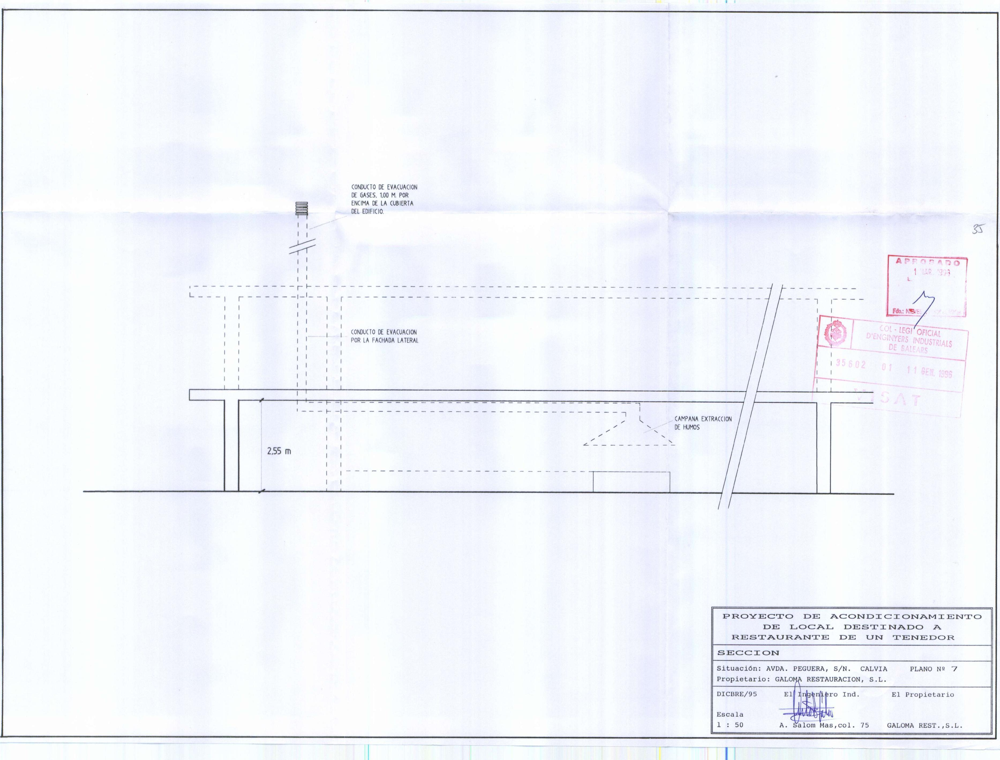

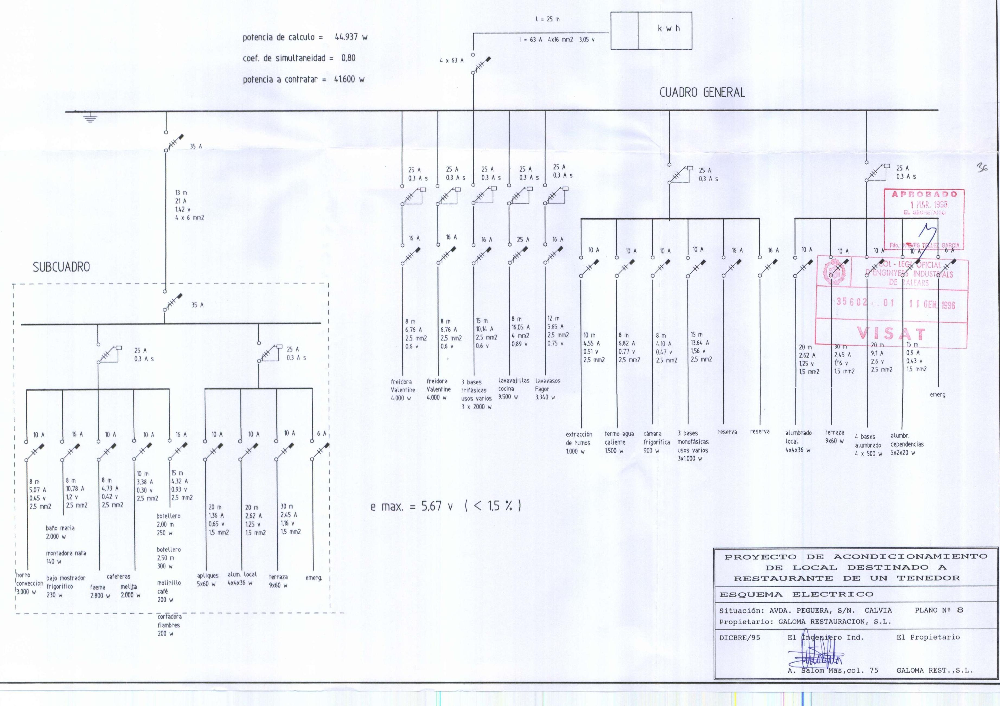

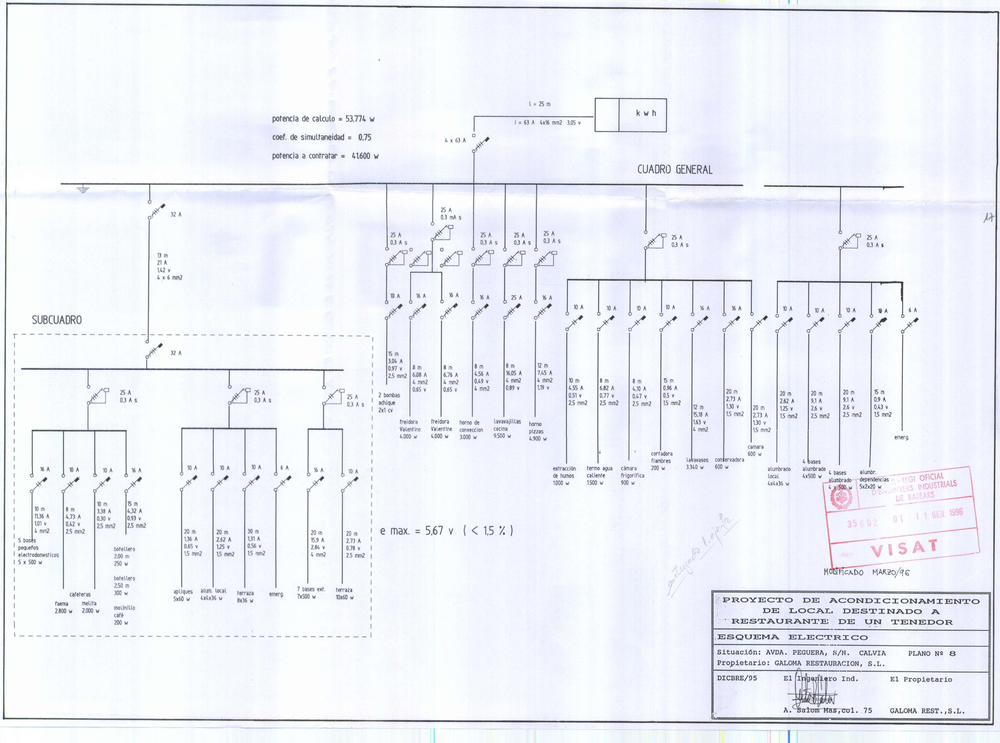

In [13]:
from mistralai.models import OCRResponse
from IPython.display import Markdown, display

def replace_images_in_markdown(markdown_str: str, images_dict: dict) -> str:
    """
    Replace image placeholders in markdown with base64-encoded images.

    Args:
        markdown_str: Markdown text containing image placeholders
        images_dict: Dictionary mapping image IDs to base64 strings

    Returns:
        Markdown text with images replaced by base64 data
    """
    for img_name, base64_str in images_dict.items():
        markdown_str = markdown_str.replace(
            f"![{img_name}]({img_name})", f"![{img_name}]({base64_str})"
        )
    return markdown_str

def get_combined_markdown(ocr_response: OCRResponse) -> str:
    """
    Combine OCR text and images into a single markdown document.

    Args:
        ocr_response: Response from OCR processing containing text and images

    Returns:
        Combined markdown string with embedded images
    """
    markdowns: list[str] = []
    # Extract images from page
    for page in ocr_response.pages:
        image_data = {}
        for img in page.images:
            image_data[img.id] = img.image_base64
        # Replace image placeholders with actual images
        markdowns.append(replace_images_in_markdown(page.markdown, image_data))

    return "\n\n".join(markdowns)

# Display combined markdowns and images
display(Markdown(get_combined_markdown(pdf_response)))

## Mistral OCR with Image

In addition to the PDF file shown above, Mistral OCR can also process image files:

In [14]:
import base64

# Verify image exists
image_file = Path("receipt.png")
assert image_file.is_file()

# Encode image as base64 for API
encoded = base64.b64encode(image_file.read_bytes()).decode()
base64_data_url = f"data:image/jpeg;base64,{encoded}"

# Process image with OCR
image_response = client.ocr.process(
    document=ImageURLChunk(image_url=base64_data_url),
    model="mistral-ocr-latest"
)

# Convert response to JSON
response_dict = json.loads(image_response.model_dump_json())
json_string = json.dumps(response_dict, indent=4)
print(json_string)

{
    "pages": [
        {
            "index": 0,
            "markdown": "# PLACE FACE UP ON DASH <br> CITY OF PALO ALTO <br> NOT VALID FOR ONSTREET PARKING \n\nExpiration Date/Time 11:59 PM\n\nAUG 19, 2024\n\nPurchase Date/Time: 01:34pm Aug 19, 2024\nTotal Due: $\\$ 15.00$\nRate: Daily Parking\nTotal Paid: $\\$ 15.00$\nPmt Type: CC (Swipe)\nTicket \\#: 00005883\nS/N \\#: 520117260957\nSetting: Permit Machines\nMach Name: Civic Center\n\\#^^^^-1224, Visa\nDISPLAY FACE UP ON DASH\n\nPERMIT EXPIRES\nAT MIDNIGHT",
            "images": [],
            "dimensions": {
                "dpi": 200,
                "height": 3210,
                "width": 1806
            }
        }
    ],
    "model": "mistral-ocr-2503-completion",
    "usage_info": {
        "pages_processed": 1,
        "doc_size_bytes": 3110191
    }
}


## Extract structured data from OCR results

OCR results can be further processed using another model.

Our goal is to extract structured data from these results. To achieve this, we will utilize the `pixtral-12b-latest` model, supported by our OCR model, to deliver better and higher-quality answers:

In [15]:
# Get OCR results for processing
image_ocr_markdown = image_response.pages[0].markdown

# Get structured response from model
chat_response = client.chat.complete(
    model="pixtral-12b-latest",
    messages=[
        {
            "role": "user",
            "content": [
                ImageURLChunk(image_url=base64_data_url),
                TextChunk(
                    text=(
                        f"This is image's OCR in markdown:\n\n{image_ocr_markdown}\n.\n"
                        "Convert this into a sensible structured json response. "
                        "The output should be strictly be json with no extra commentary"
                    )
                ),
            ],
        }
    ],
    response_format={"type": "json_object"},
    temperature=0,
)

# Parse and return JSON response
response_dict = json.loads(chat_response.choices[0].message.content)
print(json.dumps(response_dict, indent=4))

{
    "parking_receipt": {
        "instructions": "PLACE FACE UP ON DASH",
        "city": "CITY OF PALO ALTO",
        "validity": "NOT VALID FOR ONSTREET PARKING",
        "expiration": {
            "date": "AUG 19, 2024",
            "time": "11:59 PM"
        },
        "purchase": {
            "date": "Aug 19, 2024",
            "time": "01:34pm"
        },
        "amounts": {
            "total_due": "$15.00",
            "total_paid": "$15.00"
        },
        "rate": "Daily Parking",
        "payment_type": "CC (Swipe)",
        "ticket_number": "00005883",
        "serial_number": "520117260957",
        "settings": {
            "type": "Permit Machines",
            "machine_name": "Civic Center"
        },
        "card_details": {
            "card_number": "^^^^-1224",
            "type": "Visa"
        },
        "expiry_message": "PERMIT EXPIRES AT MIDNIGHT"
    }
}


In the example above, we are leveraging a model already capable of vision tasks.

However, we could also use text-only models for the structured output. Note in this case, we do not include the image in the user message:

In [16]:
# Get OCR results for processing
image_ocr_markdown = image_response.pages[0].markdown

# Get structured response from model
chat_response = client.chat.complete(
    model="ministral-8b-latest",
    messages=[
        {
            "role": "user",
            "content": [
                TextChunk(
                    text=(
                        f"This is image's OCR in markdown:\n\n{image_ocr_markdown}\n.\n"
                        "Convert this into a sensible structured json response. "
                        "The output should be strictly be json with no extra commentary"
                    )
                ),
            ],
        }
    ],
    response_format={"type": "json_object"},
    temperature=0,
)

# Parse and return JSON response
response_dict = json.loads(chat_response.choices[0].message.content)
print(json.dumps(response_dict, indent=4))


{
    "expiration_date_time": "11:59 PM",
    "expiration_date": "AUG 19, 2024",
    "purchase_date_time": "01:34pm Aug 19, 2024",
    "total_due": 15.0,
    "rate": "Daily Parking",
    "total_paid": 15.0,
    "payment_type": "CC (Swipe)",
    "ticket_number": "00005883",
    "serial_number": "520117260957",
    "setting": "Permit Machines",
    "machine_name": "Civic Center",
    "card_number": "1224",
    "card_type": "Visa"
}


## All Together - Mistral OCR + Custom Structured Output
Let's design a simple function that takes an `image_path` file and returns a JSON structured output in a specific format. In this case, we arbitrarily decided we wanted an output respecting the following:

```python
class StructuredOCR:
    file_name: str  # can be any string
    topics: list[str]  # must be a list of strings
    languages: str  # string
    ocr_contents: dict  # any dictionary, can be freely defined by the model
```

We will make use of [custom structured outputs](https://docs.mistral.ai/capabilities/structured-output/custom_structured_output/).

In [17]:
from enum import Enum
from pathlib import Path
from pydantic import BaseModel
import base64


class StructuredOCR(BaseModel):
    file_name: str
    topics: list[str]
    languages: str
    ocr_contents: dict

def structured_ocr(image_path: str) -> StructuredOCR:
    """
    Process an image using OCR and extract structured data.

    Args:
        image_path: Path to the image file to process

    Returns:
        StructuredOCR object containing the extracted data

    Raises:
        AssertionError: If the image file does not exist
    """
    # Validate input file
    image_file = Path(image_path)
    assert image_file.is_file(), "The provided image path does not exist."

    # Read and encode the image file
    encoded_image = base64.b64encode(image_file.read_bytes()).decode()
    base64_data_url = f"data:image/jpeg;base64,{encoded_image}"

    # Process the image using OCR
    image_response = client.ocr.process(
        document=ImageURLChunk(image_url=base64_data_url),
        model="mistral-ocr-latest"
    )
    image_ocr_markdown = image_response.pages[0].markdown

    # Parse the OCR result into a structured JSON response
    chat_response = client.chat.parse(
        model="pixtral-12b-latest",
        messages=[
            {
                "role": "user",
                "content": [
                    ImageURLChunk(image_url=base64_data_url),
                    TextChunk(text=(
                        f"This is the image's OCR in markdown:\n{image_ocr_markdown}\n.\n"
                        "Convert this into a structured JSON response "
                        "with the OCR contents in a sensible dictionnary."
                        )
                    )
                ]
            }
        ],
        response_format=StructuredOCR,
        temperature=0
    )

    return chat_response.choices[0].message.parsed

We can now extract structured output from any image parsed with our OCR model.

In [18]:
# Example usage
image_path = "receipt.png" # Path to sample receipt image
structured_response = structured_ocr(image_path) # Process image and extract data

# Parse and return JSON response
response_dict = json.loads(structured_response.model_dump_json())
print(json.dumps(response_dict, indent=4))

{
    "file_name": "parking_receipt",
    "topics": [
        "Parking",
        "Receipt",
        "City of Palo Alto"
    ],
    "languages": "English",
    "ocr_contents": {
        "header": "PLACE FACE UP ON DASH CITY OF PALO ALTO NOT VALID FOR ONSTREET PARKING",
        "expiration_date_time": "11:59 PM AUG 19, 2024",
        "purchase_date_time": "01:34pm Aug 19, 2024",
        "total_due": "$15.00",
        "rate": "Daily Parking",
        "total_paid": "$15.00",
        "payment_type": "CC (Swipe)",
        "ticket_number": "00005883",
        "serial_number": "520117260957",
        "setting": "Permit Machines",
        "machine_name": "Civic Center",
        "additional_info": "#^^^^-1224, Visa DISPLAY FACE UP ON DASH PERMIT EXPIRES AT MIDNIGHT"
    }
}


The original image for comparison can be found below.

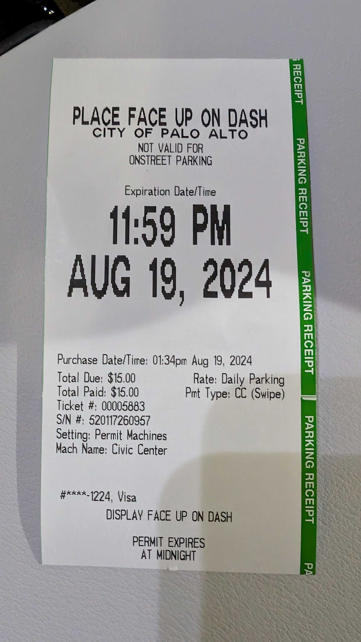

In [19]:
from PIL import Image

image = Image.open(image_path)
image.resize((image.width // 5, image.height // 5))
